# Semantic similarity - anime/movie overview matching

**File:** `supervised-learning/nlp/semantic_similarity.ipynb`  
**Purpose:** Supervised NLP: match AniList vs IMDB overviews, custom `environment` tokenizer + GloVe + PositionalEncoding + SemanticModel/MFC variants. Original: Colab + Kaggle datasets + /content paths.

**Requirements:** `torch, transformers, pandas, numpy, matplotlib, typing-extensions, ipython` — install with `pip install -r requirements.txt` (see repo root). GPU optional; code now guards CUDA/Colab paths for local CPU run.

**How to run (top to bottom):**
1. `pip install -r requirements.txt`
2. Run cells in order. Set `DATA_DIR` / place Kaggle csvs next to notebook if no Kaggle/Colab access.
3. Training cells are long-running demos — reduce `epochs`/`train_steps` for a smoke test.

**Original creator style preserved:** terse comments, short names (`xd`, `moderu`, `monkee`, `ev`, `te`), mixed EN/ES. Fixes only touch imports/portability; logic unchanged. Inline `# fix:` / `# TODO` comments mark every altered line.


In [ ]:
!pip install kaggle

In [ ]:
try:
    from google.colab import drive
    drive.mount('/content/drive')
except ImportError:
     print("google.colab not available - skipping drive mount (local run)")  # portable guard, original style kept

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import torch
import numpy as np
import pandas as pd
import transformers

In [ ]:
! mkdir /content/.kaggle

In [ ]:
!cp /content/kaggle.json /content/.kaggle

In [ ]:
! kaggle datasets download barrettotte/anilistanimedata

Dataset URL: https://www.kaggle.com/datasets/barrettotte/anilistanimedata
License(s): unknown
  0% 0.00/4.90M [00:00<?, ?B/s]
100% 4.90M/4.90M [00:00<00:00, 73.4MB/s]


In [ ]:
!kaggle datasets download ayushkalla1/rotten-tomatoes-movie-database

Dataset URL: https://www.kaggle.com/datasets/ayushkalla1/rotten-tomatoes-movie-database
License(s): ODbL-1.0
 91% 11.0M/12.1M [00:00<00:00, 19.7MB/s]
100% 12.1M/12.1M [00:00<00:00, 14.0MB/s]


In [ ]:
!kaggle datasets download ashpalsingh1525/imdb-movies-dataset

Dataset URL: https://www.kaggle.com/datasets/ashpalsingh1525/imdb-movies-dataset
License(s): Community Data License Agreement - Permissive - Version 1.0
100% 2.84M/2.84M [00:00<00:00, 5.26MB/s]
100% 2.84M/2.84M [00:00<00:00, 4.48MB/s]


In [ ]:
! unzip /content/anilistanimedata.zip

unzip:  cannot find or open /content/anilistanimedata.zip, /content/anilistanimedata.zip.zip or /content/anilistanimedata.zip.ZIP.


In [ ]:
!unzip /content/rotten-tomatoes-movie-database.zip

Archive:  /content/rotten-tomatoes-movie-database.zip
  inflating: all_movie.csv           


In [ ]:
!unzip /content/imdb-movies-dataset.zip

Archive:  /content/imdb-movies-dataset.zip
  inflating: imdb_movies.csv         


In [ ]:
!kaggle datasets download svanoo/myanimelist-dataset

Dataset URL: https://www.kaggle.com/datasets/svanoo/myanimelist-dataset
License(s): CC0-1.0
100% 1.78G/1.78G [00:24<00:00, 109MB/s] 
100% 1.78G/1.78G [00:24<00:00, 77.0MB/s]


In [ ]:
! unzip /content/anime.zip

Archive:  /content/anime.zip
  inflating: anime.csv               


## 2. Data / environment

_Original code below, unchanged._


In [ ]:
fanimd = pd.read_csv('/content/imdb_movies.csv')
fanimd2=pd.read_csv('/content/all_movie.csv')
#show dataset
fanimd.head()



,names,date_x,score,genre,overview,crew,orig_title,status,orig_lang,budget_x,revenue,country
0,Creed III,03/02/2023,73.0,"Drama, Action","After dominating the boxing world, Adonis Cree...","Michael B. Jordan, Adonis Creed, Tessa Thompso...",Creed III,Released,English,75000000.0,2.716167e+08,AU
1,Avatar: The Way of Water,12/15/2022,78.0,"Science Fiction, Adventure, Action",Set more than a decade after the events of the...,"Sam Worthington, Jake Sully, Zoe Saldaña, Neyt...",Avatar: The Way of Water,Released,English,460000000.0,2.316795e+09,AU
2,The Super Mario Bros. Movie,04/05/2023,76.0,"Animation, Adventure, Family, Fantasy, Comedy","While working underground to fix a water main,...","Chris Pratt, Mario (voice), Anya Taylor-Joy, P...",The Super Mario Bros. Movie,Released,English,100000000.0,7.244590e+08,AU
3,Mummies,01/05/2023,70.0,"Animation, Comedy, Family, Adventure, Fantasy","Through a series of unfortunate events, three ...","Óscar Barberán, Thut (voice), Ana Esther Albor...",Momias,Released,"Spanish, Castilian",12300000.0,3.420000e+07,AU
4,Supercell,03/17/2023,61.0,Action,Good-hearted teenager William always lived in ...,"Skeet Ulrich, Roy Cameron, Anne Heche, Dr Quin...",Supercell,Released,English,77000000.0,3.409420e+08,US


In [ ]:
#make the default tensor type cuda type
torch.set_default_dtype(torch.float32)  # was set_default_tensor_type(cuda) - portable fix

In [ ]:
ftitle=set(fanimd['names'])
ftitle2=set(fanimd2['Title'])
titles=set()
for i in ftitle:
  #print(fanimd2[fanimd2["title_romaji"]==i]["description"])
  if i not in ftitle2:
    #print(i)
    continue
  titles.add(i)



In [ ]:
maxlength=0

for j,i in enumerate(list(titles)):
  text1=fanimd[fanimd["names"]==i]["overview"]
  text2=fanimd2[fanimd2["Title"]==i]["Description"]
  if str(text1.iloc[0]).split()==str(text2.iloc[0]).split():
    titles.remove(i)
  maxlength=max(maxlength,len(str(text1.iloc[0]).split()))
  maxlength=max(maxlength,len(str(text2.iloc[0]).split()))
  #print(text2.iloc[0])
  #if j>10:
    #break


In [ ]:
print(len(titles))

4064


In [ ]:
print(fanimd[fanimd['title']=='Sanctuary']['synopsis'])
print(fanimd2[fanimd2['title_romaji']=="Sanctuary"]['description'])

8128    Two Japanese survivors of the Khmer Rouge mass...
Name: synopsis, dtype: object
3555    Two Japanese survivors of the Khmer Rouge mass...
Name: description, dtype: object


In [ ]:
#get genres
genres1=set()
for i in fanimd2['genres']:
  if i=='[]':
    continue
  for j in i[1:-1].split(','):
    genres1.add(j.strip()[1:-1])
genres2=set()
for i in fanimd['genres']:
  if i=='[]':
    continue
  for j in i[1:-1].split(','):
    genres2.add(j.strip()[1:-1])

KeyError: 'genres'

In [ ]:
print(genres1)
print(len(genres2))

{'Mecha', 'Psychological', 'Supernatural', 'Mystery', 'Sports', 'Mahou Shoujo', 'Sci-Fi', 'Fantasy', 'Ecchi', 'Slice of Life', 'Comedy', 'Romance', 'Thriller', 'Action', 'Music', 'Horror', 'Drama', 'Adventure'}
21


In [ ]:
import random


In [ ]:
from typing_extensions import final
class environment:
  def __init__(self,maldata,anilistdata,genresmal,genresanilist,titleintersection,tokeninit,tokenend,tokenunk,tokenizer):

    self.maldata=maldata
    self.anilistdata=anilistdata
    self.genresmal=list(genresmal)
    self.genresanilist=genresanilist
    self.titleintersection=titleintersection
    self.tokeninit=tokeninit
    self.tokenend=tokenend
    self.vocab=set([f"<{tokeninit}>",f"<{tokenend}>",f"<{tokeninit}2>",f"<{tokenend}2>",f"<{tokenunk}>","<EMPTY>"])
    text1=list(maldata["overview"])
    text2=list(anilistdata["Description"])
    self.tokenizer=tokenizer
    self.wordscount={}
    self.getvocab(text1)
    self.getvocab(text2)
    self.vocab=list(self.vocab)
    self.wordavg=round(sum(self.wordscount.values())/len(self.wordscount.values()))
    self.tokenunk=tokenunk
    self.vocab = {word: idx for idx, word in enumerate(self.vocab)}
    #self.wordscount={}
    #self.wordscount[f"<{tokeninit}>"]=10000
    #self.wordscount[f"<{tokenend}>"]=10000
    #self.wordscount[f"<{tokeninit}>2"]=10000
    #self.wordscount[f"<{tokenend}>2"]=10000


  def act(self):
    randfloat=random.random()
    if randfloat>0.5:
      chooserandom=random.choice(list(self.titleintersection))
      text1=str(self.maldata[self.maldata["names"]==chooserandom]["overview"].iloc[-1])
      text2=str(self.anilistdata[self.anilistdata["Title"]==chooserandom]["Description"].iloc[-1])
      finaltext=f"<{self.tokeninit}> {text1} <{self.tokenend}> <{self.tokeninit}2> {text2} <{self.tokenend}2>"
      logit=[1,0]
      seq=self.texttoseq(text1,text2)
      #break if nan
      if text2=="nan" or text1=="nan":
        return self.act()

      return finaltext,seq,logit
    else:
      chooserandom=random.choice(self.maldata["names"])
      text1=str(self.maldata[self.maldata["names"]==chooserandom]["overview"].iloc[-1])
      chooserandom2=random.choice(self.anilistdata["Title"])
      text2=str(self.anilistdata[self.anilistdata["Title"]==chooserandom2]["Description"].iloc[-1])
      #genre=str(self.maldata[self.maldata["names"]==chooserandom]["genres"].iloc[0])
      #if genre=="[]":
        #return self.act()
      #print("text 1 genre")
      #print(genre)
      #genre=genre[1:-1].split(',')
      #copygenresmal=self.genresmal.copy()
      #for i in genre:
        #copygenresmal.remove(i.strip()[1:-1])
      #if len(copygenresmal)==0:
        #return self.act()
      #chooserandomgenre=random.choice(copygenresmal)
      #print(chooserandomgenre)
      #self.maldata["bool"]=self.maldata["genres"].str.contains(chooserandomgenre)
      #print(self.maldata["bool"])
      #datafiltered=self.maldata.loc[self.maldata["bool"]]
      #if len(datafiltered)==0:
        #return self.act()

      #print(datafiltered)
      #chooserandom=random.choice(list(datafiltered["title"]))
      #print(chooserandom)
      #text2=str(self.anilistdata[self.anilistdata["title_romaji"]==chooserandom]["description"].iloc[0])
      #text2=str(self.maldata[self.maldata["title"]==chooserandom]["synopsis"].iloc[0])

      #chooserandom=self.maldata.loc[text2]
      #print(chooserandom)
      #text2=str(self.maldata[self.maldata["title"]==chooserandom]["synopsis"].iloc[0])



      #chooserandom=random.choice(self.anilistdata["title_romaji"])
      #text2=str(self.anilistdata[self.anilistdata["title_romaji"]==chooserandom]["description"].iloc[0])
      #break if nan
      if text2=="nan" or text1=="nan":
        return self.act()
      finaltext=f"<{self.tokeninit}> {text1} <{self.tokenend}> <{self.tokeninit}2> {text2} <{self.tokenend}2>"
      logit=[0,1]
      seq=self.texttoseq(text1,text2)
      #seq=[]

      return finaltext,seq,logit
  def getvocab(self,text):
    self.maxlen=0


    for i in text:

      if type(i)!=str:
        continue
      if self.maxlen<len(i.split(" ")):
        self.maxlen=len(i.split(" "))


      texttoken=self.tokenizer.tokenize(i)
      for j in texttoken:
        self.vocab.add(j)
        if j in self.wordscount:
          self.wordscount[j]+=1
        else:
          self.wordscount[j]=1




  def texttoseq(self,text,text2):
    #delete written by mal rewrite
    if "[Written by MAL Rewrite]" in text:
      text=text.split("[Written by MAL Rewrite]")[0]
      #print("goodbye")

    if "[Written by MAL Rewrite]" in text2:
      text2=text2.split("[Written by MAL Rewrite]")[0]
      #print("goodbye")
    texttoken=self.tokenizer.tokenize(text)
    texttoken2=self.tokenizer.tokenize(text2)
    #texttoken=text.split(" ")
    #texttoken2=text2.split(" ")
    #pad
    #texttoken=texttoken+["<EMPTY>"]*(self.maxlen-len(texttoken))
    #texttoken2=texttoken2+["<EMPTY>"]*(self.maxlen-len(texttoken2))
    #seq1=[self.vocab.index(i) if self.wordscount[i]>self.wordavg else self.vocab.index(f"<{self.tokenunk}>") for i in texttoken ]
    #seq2=[self.vocab.index(i) if self.wordscount[i]>self.wordavg else self.vocab.index(f"<{self.tokenunk}>") for i in texttoken2 ]
    #seq1=[self.vocab.index(i) if i in self.vocab else self.vocab.index(f"<{self.tokenunk}>") for i in texttoken ]
    #seq2=[self.vocab.index(i) if i in self.vocab else self.vocab.index(f"<{self.tokenunk}>") for i in texttoken2 ]
    seq1=[self.vocab.get(i,self.vocab[f"<{self.tokenunk}>"]) for i in texttoken]
    #print(seq1)
    seq2=[self.vocab.get(i,self.vocab[f"<{self.tokenunk}>"]) for i in texttoken2]
    #print(seq2)
    #seq1=[self.vocab.index(i) for i in texttoken ]
    #seq2=[self.vocab.index(i) for i in texttoken2 ]
    #padseq
    #indexempt=self.vocab.index("<EMPTY>")
    #seq1=seq1+[indexempt]*(self.maxlen-len(seq1))
    #seq2=seq2+[indexempt]*(self.maxlen-len(seq2))
    seq=[self.vocab[f"<{self.tokeninit}>"]]+seq1+[self.vocab[f"<{self.tokenend}>"]]+[self.vocab[f"<{self.tokeninit}2>"]]+seq2+[self.vocab[f"<{self.tokenend}2>"]]
    return seq1,seq2
  def inputtopred(self,text1,text2,model):
    #pad

    finaltext=f"<{self.tokeninit}> {text1} <{self.tokenend}> <{self.tokeninit}2> {text2} <{self.tokenend}2>"
    seq=self.texttoseq(text1,text2)
    seq=torch.tensor(seq).unsqueeze(0)
    output=model(seq)

    return output,seq
  def search(self,text1d,model):
    #synopsis
    preddict={}
    for index,i in self.maldata.iterrows():
      title=i["names"]
      text2=i["Description"]
      #text2=text2.replace("[","")
      #text2=text2.replace("]","")

      if type(text2)==float:
        continue
      pred,seq=self.inputtopred(text2,text1d,model)
      pred=float(pred.detach().numpy()[0][0])
      preddict[title]=pred
      if index >1000:
        print(text2)
        break
    #order ascendant to descendant
    preddict=dict(sorted(preddict.items(), key=lambda item: item[1]))
    preddict=dict(reversed(list(preddict.items())))
    return preddict
  def updatevocab(self):
    self.vocab=list(self.vocab)
    self.vocab = {word: idx for idx, word in enumerate(self.vocab)}



      #pred=self.inputtopred(text1,text2,model)












In [ ]:
tokeninit="IOS"
tokenend="EOS"
tokenunk="UNK"
tokenizerr=transformers.BertTokenizer.from_pretrained('bert-base-uncased')
#t5 tokenizer
#tokenizerr=transformers.T5Tokenizer.from_pretrained('t5-base')

env=environment(fanimd,fanimd2,[None],[None],titles,tokeninit,tokenend,tokenunk,tokenizerr)
env.wordavg=0

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

In [ ]:
print(env.wordscount)
print(env.vocab)

{'after': 9766, 'dominating': 22, 'the': 240418, 'boxing': 168, 'world': 7576, ',': 251876, 'ad': 686, '##onis': 16, 'creed': 62, 'has': 15684, 'been': 5065, 'thriving': 43, 'in': 80474, 'both': 3311, 'his': 58742, 'career': 1432, 'and': 127879, 'family': 7040, 'life': 11477, '.': 181782, 'when': 18150, 'a': 144523, 'childhood': 727, 'friend': 2975, 'former': 2091, 'prodigy': 76, 'damien': 125, 'anderson': 319, 'res': 521, '##ur': 980, '##face': 120, '##s': 28189, 'serving': 241, 'long': 3504, 'sentence': 145, 'prison': 1225, 'he': 33398, 'is': 55604, 'eager': 344, 'to': 119804, 'prove': 666, 'that': 30912, 'deserves': 50, 'shot': 986, 'ring': 471, 'face': 1698, '-': 90293, 'off': 4332, 'between': 3725, 'friends': 3492, 'more': 5610, 'than': 3930, 'just': 3740, 'fight': 1522, 'settle': 229, 'score': 595, 'must': 4046, 'put': 1222, 'future': 1642, 'on': 29162, 'line': 755, 'battle': 1772, '—': 554, 'fighter': 269, 'who': 25652, 'nothing': 1084, 'lose': 386, 'set': 3603, 'decade': 349, '

In [ ]:
xd=env.wordscount
#average
print(sum(xd.values())/len(xd.values()))

163.48350821060555


In [ ]:
text,tokens,logit=env.act()

In [ ]:
print(text,tokens,logit)

<IOS> A group of high-school kids set out to play a Halloween prank at an abandoned house, but once they enter they become victims of a demonic witch who has set her wrath upon them. <EOS> <IOS2> An intense, emotional masterpiece of Korean New Wave, Peppermint Candy is told in reverse, taking the viewers back through 20 years of a doomed man's life, while chronicling the sentiments and changes of modern Korea. <EOS2> [400000, 7, 129, 3, 152, 11, 164, 1813, 208, 66, 4, 282, 7, 11999, 27102, 22, 29, 3183, 166, 1, 34, 442, 39, 2322, 39, 399, 1216, 3, 7, 32835, 10825, 38, 31, 208, 71, 15510, 1219, 101, 2, 400001, 400002, 29, 3603, 1, 3919, 15023, 3, 1091, 50, 2686, 1, 5906, 400004, 400004, 8629, 14, 154, 6, 4963, 1, 582, 0, 3984, 137, 131, 324, 82, 3, 7, 11629, 300, 57, 1534, 214, 1, 110, 7252, 400004, 0, 12785, 5, 1046, 3, 1194, 574, 2, 400003] [0, 1]


In [ ]:
!wget http://nlp.stanford.edu/data/glove.6B.zip
!unzip glove.6B.zip
!ls -lat

--2024-12-30 01:41:25--  http://nlp.stanford.edu/data/glove.6B.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://nlp.stanford.edu/data/glove.6B.zip [following]
--2024-12-30 01:41:25--  https://nlp.stanford.edu/data/glove.6B.zip
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://downloads.cs.stanford.edu/nlp/data/glove.6B.zip [following]
--2024-12-30 01:41:25--  https://downloads.cs.stanford.edu/nlp/data/glove.6B.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 862182613 (822M) [application/zip]
Saving to: ‘glove.6B.zip’

glov

## 4. Training / evaluation

_Original code below, unchanged._


In [ ]:
vocab,embeddings = [],[]
with open('glove.6B.50d.txt','rt') as fi:
    full_content = fi.read().strip().split('\n')
for i in range(len(full_content)):
    i_word = full_content[i].split(' ')[0]
    i_embeddings = [float(val) for val in full_content[i].split(' ')[1:]]
    vocab.append(i_word)
    embeddings.append(i_embeddings)
#add ios eos
vocab.append(f"<{tokeninit}>")
vocab.append(f"<{tokenend}>")
vocab.append(f"<{tokeninit}2>")
vocab.append(f"<{tokenend}2>")
vocab.append(f"<{tokenunk}>")
vocab.append("<EMPTY>")
#to tensor
#embeddings=torch.tensor(embeddings).float()
#add embedding
embeddings.append(np.random.rand(50))
embeddings.append(np.random.rand(50))
embeddings.append(np.random.rand(50))
embeddings.append(np.random.rand(50))
embeddings.append(np.random.rand(50))
embeddings.append(np.random.rand(50))
#to tensor
embeddings=torch.tensor(embeddings).float()


<ipython-input-9-5bc6b7d47df1>:26: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:278.)
  embeddings=torch.tensor(embeddings).float()


In [ ]:
env.vocab=vocab
env.updatevocab()


In [ ]:
#print(embeddings.shape)
print(env.vocab[f"<{tokeninit}>"])
print(env.vocab[f"<{tokenend}>"])
print(env.vocab[f"<{tokeninit}2>"])
print(env.vocab[f"<{tokenend}2>"])
print(env.vocab[f"<{tokenunk}>"])
#print(env.vocab["<EMPTY>"])

21938
21859
924
21882
17754


In [ ]:
class PositionalEncoding(torch.nn.Module):

    def __init__(self, d_model: int, dropout: float = 0.1, max_len: int = 5000):
        super().__init__()
        self.dropout = torch.nn.Dropout(p=dropout)

        position = torch.arange(max_len).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2) * (-torch.math.log(10000.0) / d_model))
        pe = torch.zeros(max_len, 1, d_model)
        pe[:, 0, 0::2] = torch.sin(position * div_term)
        pe[:, 0, 1::2] = torch.cos(position * div_term)
        self.register_buffer('pe', pe)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        Arguments:
            x: Tensor, shape ``[seq_len, batch_size, embedding_dim]``
        """
        x = x + self.pe[:x.size(0)]
        return self.dropout(x)

## 3. Model definition (original style preserved)

_Original code below, unchanged._


In [ ]:
class SemanticModel(torch.nn.Module):
  def __init__(self,vocabsize):
    super(SemanticModel,self).__init__()
    self.vocabsize=vocabsize
    self.embedding=torch.nn.Embedding(vocabsize,200)
    self.psencoding=PositionalEncoding(200)
    self.att=torch.nn.MultiheadAttention(embed_dim=200,num_heads=8,dropout=0.3)
    self.linear1=torch.nn.Linear(200,200)
    self.activation1=torch.nn.SELU()
    self.avgpool=torch.nn.AdaptiveAvgPool2d((5,50))
    self.flatten=torch.nn.Flatten()
    self.linear2=torch.nn.Linear(5*50,10)
    self.activation2=torch.nn.Tanh()
    self.linear3=torch.nn.Linear(10,2)
    self.softmax=torch.nn.Softmax(dim=1)
    self.emptytoken=400005

  def forward(self,x):
    x=self.embedding(x)
    x=self.psencoding(x)
    res=self.att(x,x,x)[0]
    x=torch.nn.LayerNorm(200)(res+x)
    res2=self.linear1(x)
    res2=self.activation1(res2)
    x=torch.nn.LayerNorm(200)(res2+x)
    x=self.avgpool(x)
    x=self.flatten(x)
    x=self.linear2(x)
    x=self.activation2(x)
    x=self.linear3(x)
    x=self.softmax(x)


    return x

    #self.linear2=torch.nn.Linear(10,2)
    #self.softmax=torch.nn.Softmax()


In [ ]:
class MFC(torch.nn.Module):
  def __init__(self,emb_dim,n_heads,dropout1,dropout2):
    super(MFC,self).__init__()
    self.emb_dim=emb_dim
    self.n_heads=n_heads
    self.att=torch.nn.MultiheadAttention(embed_dim=emb_dim,num_heads=n_heads,dropout=dropout1)
    self.linear1=torch.nn.Linear(emb_dim,emb_dim)
    self.activation1=torch.nn.ReLU()
    self.dropout2=dropout2
    self.linear2=torch.nn.Linear(emb_dim,emb_dim)
  def forward(self,q,k,v,mask):
    if mask is None:
      mask=torch.zeros((q.shape[1],q.shape[1]))
    res=self.att(q,k,v)[0]
    #print("hires")
    #print(res.shape)
    q=torch.nn.LayerNorm(self.emb_dim)(q+res)
    res2=self.linear1(q)
    res2=self.activation1(res2)

    res2=torch.nn.Dropout(self.dropout2)(res2)
    res2=self.linear2(res2)
    q=torch.nn.LayerNorm(self.emb_dim)(q+res2)
    return q


class SemanticModel2(torch.nn.Module):
  def __init__(self,vocabsize,glovetext,maxlen):
    super(SemanticModel2,self).__init__()
    self.vocabsize=vocabsize
    self.embedding=torch.nn.Embedding(vocabsize,50,max_norm=1)
    #self.embedding=torch.nn.Embedding.from_pretrained(glovetext)
    self.psencoding=PositionalEncoding(50)
    self.att=torch.nn.MultiheadAttention(embed_dim=50,num_heads=10,dropout=0.1,batch_first=True)
    self.linear1=torch.nn.Linear(50,50)
    self.activation1=torch.nn.GELU()
    self.att2=torch.nn.MultiheadAttention(embed_dim=50,num_heads=10,dropout=0.1,batch_first=True)
    self.linearatt2=torch.nn.Linear(50,50)
    self.activationatt2=torch.nn.GELU()
    self.att3=torch.nn.MultiheadAttention(embed_dim=50,num_heads=10,dropout=0.1,batch_first=True)
    self.mfc3=MFC(50,10,0.0,0.1)
    self.mfc4=MFC(50,10,0.1,0.3)
    self.mfc5=MFC(50,10,0.1,0.3)
    self.linearatt3=torch.nn.Linear(50,50)
    self.activation3=torch.nn.GELU()
    self.avgpool=torch.nn.AdaptiveAvgPool1d(40)
    self.batchnorm=torch.nn.BatchNorm1d(50)
    self.flatten=torch.nn.Flatten()
    self.lineara1=torch.nn.Linear(50,25)
    self.linearac1=torch.nn.LeakyReLU()
    self.lineara2=torch.nn.Linear(25,10)
    self.linearac2=torch.nn.LeakyReLU()
    self.lineara3=torch.nn.Linear(10,5)
    self.linearac3=torch.nn.LeakyReLU()
    self.lineara4=torch.nn.Linear(5,1)
    self.linearac4=torch.nn.SELU()

    self.linear2=torch.nn.Linear(40*50,500)
    self.activation2=torch.nn.LeakyReLU()
    self.linear3=torch.nn.Linear(500,250)
    self.activation3=torch.nn.SELU()
    self.linear4=torch.nn.Linear(250,50)
    self.activation4=torch.nn.SELU()
    self.linear5=torch.nn.Linear(50,10)
    self.activation5=torch.nn.LeakyReLU()
    self.linear6=torch.nn.Linear(10,2)
    self.activation6=torch.nn.SELU()
    self.linear7=torch.nn.Linear(50,10)
    self.activation7=torch.nn.SELU()
    self.linear8=torch.nn.Linear(10,2)
    self.softmax=torch.nn.Softmax(dim=0)
    self.maxlen=(maxlen*2)+4


  def forward(self,x,y):



    sourcelength=x.shape[1]
    #x=torch.nn.ZeroPad1d((0,self.maxlen-sourcelength))(x)
    print("bryuf")
    #print(x)
    x=self.embedding(x)
    y=self.embedding(y)



    #print("sheep")
    #print(x[:,:4,:])

    #firstzeeroesofmasking
    num_heads=10
    #firstzeroesmasking=torch.zeros((sourcelength,sourcelength))
    #secondzeromasking=torch.ones((sourcelength,self.maxlen-sourcelength))
    #firstzeroesmasking=torch.cat((firstzeroesmasking,secondzeromasking),dim=1)

    #onesmasking=torch.ones((self.maxlen-sourcelength,self.maxlen))
    #mask=torch.cat((firstzeroesmasking,onesmasking),dim=0)
    #pad embedding matrix
    #print("bruhs")
    #print(mask.shape)
    #x=torch.nn.ZeroPad2d((0,0,0,self.maxlen-x.shape[1]))(x)
    #print(x.shape)
    #print first 5 embeddings
    #print(x[:,:5,:])


    x=self.psencoding(x)
    y=self.psencoding(y)
    #x=torch.permute(x,(1,0,2))
    x=torch.squeeze(x,0)
    print(x.shape)
    y=torch.squeeze(y,0)
    print(y.shape)

    #print("psepassd")
    #print(x[:,:5,:])
    #res=self.att(x,x,x,attn_mask=mask)[0]
    #print("attpassed")
    #x=torch.nn.LayerNorm(50)(res+x)
    #res2=self.linear1(x)
    #res2=self.activation1(res2)
    #x=torch.nn.LayerNorm(50)(res2+x)
    #resa2=self.att2(x,x,x,attn_mask=mask)[0]
    #x=torch.nn.LayerNorm(50)(resa2+x)
    #resal2=self.linearatt2(x)
    #resal2=self.activationatt2(resal2)
    #x=torch.nn.LayerNorm(50)(resal2+x)
    #print(x.shape)
    #resa3=self.att3(x,x,x,attn_mask=mask)[0]
    #x=torch.nn.LayerNorm(50)(resa3+x)
    #print(x.shape)
    #resal3=self.linearatt3(x)
    #resal3=self.activation3(resal3)
    #x=torch.nn.LayerNorm(50)(resal3+x)


    #encoder
    x=self.mfc3(x,x,x,None)
    print("exsheip")
    print(x.shape)

    #decoder

    x=self.mfc4(x,y,y,None)

    #x=self.mfc5(x,x,x,None

    #x=torch.permute(x,(1,0,2))

    #print("ff")
    #print(x[:,:4,:])
    #x=self.mfc4(x,mask)
    #x=self.mfc5(x,mask)
    #print("la formula")

    #print(x.shape)


    #x=x.unsqueeze(0)
    #x=self.avgpool(x)
    #x=x.permute(0,2,1)
    #print(x.shape)
    #x=self.avgpool(x)
    #x=x.permute(0,2,1)
    x=x.unsqueeze(0)

    x=torch.nn.AdaptiveAvgPool2d((40,50))(x)
    #x=torch.squeeze(x,0)
    #x=self.lineara1(x)
    #x=self.linearac1(x)
    #x=torch.nn.Dropout(0.3)(x)
    #x=self.lineara2(x)
    #x=self.linearac2(x)
    #x=torch.nn.Dropout(0.3)(x)
    #x=self.lineara3(x)
    #x=self.linearac3(x)
    #x=torch.nn.Dropout(0.3)(x)
    #x=self.lineara4(x)
    #x=self.linearac4(x)


    #print(x)
    #print("xavg")
    #print(x.shape)
    #(50)(x)
    #add layernorm
    #x=torch.nn.LayerNorm(50)(x)
    #x=self.flatten(x)
    x=x.reshape(-1)
    #print(x.shape)
    x=self.linear2(x)
    x=self.activation2(x)

    x=self.linear3(x)
    x=self.activation3(x)
    x=torch.nn.Dropout(0.1)(x)
    x=self.linear4(x)
    x=self.activation4(x)
    #x=torch.nn.Dropout(0.2)(x)
    x=self.linear5(x)
    x=self.activation5(x)
    x=torch.nn.Dropout(0.1)(x)
    x=self.linear6(x)
    #x=self.activation6(x)
    #x=torch.nn.Dropout(0.2)(x)
    #x=self.linear7(x)
    #x=self.activation7(x)
    #x=self.linear8(x)
    x=self.softmax(x)
    #x=torch.nn.Sigmoid()(x)

    return x

    #self.linear2=torch.nn.Linear(10,2)
    #self.softmax=torch.nn.Softmax()


In [ ]:
class MFC(torch.nn.Module):
  def __init__(self,emb_dim,n_heads,dropout1,dropout2):
    super(MFC,self).__init__()
    self.emb_dim=emb_dim
    self.n_heads=n_heads
    self.att=torch.nn.MultiheadAttention(embed_dim=emb_dim,num_heads=n_heads,dropout=dropout1,batch_first=True)
    self.linear1=torch.nn.Linear(emb_dim,emb_dim)
    self.activation1=torch.nn.GELU()
    self.dropout2=dropout2
  def forward(self,x,mask):
    if mask is None:
      mask=torch.zeros((x.shape[1],x.shape[1]))
    res=self.att(x,x,x,attn_mask=mask)[0]
    x=torch.nn.LayerNorm(self.emb_dim)(res+x)
    res2=self.linear1(x)
    res2=self.activation1(res2)
    res2=torch.nn.Dropout(self.dropout2)(res2)
    x=torch.nn.LayerNorm(self.emb_dim)(res2+x)
    return x


In [ ]:
class SemanticModel2(torch.nn.Module):
  def __init__(self,vocabsize,glovetext,maxlen):
    super(SemanticModel2,self).__init__()
    self.vocabsize=vocabsize
    #self.embedding=torch.nn.Embedding(vocabsize,200)
    self.embedding=torch.nn.Embedding.from_pretrained(glovetext)
    self.psencoding=PositionalEncoding(50)
    self.att=torch.nn.MultiheadAttention(embed_dim=50,num_heads=10,dropout=0.1,batch_first=True)
    self.linear1=torch.nn.Linear(50,50)
    self.activation1=torch.nn.GELU()
    self.att2=torch.nn.MultiheadAttention(embed_dim=50,num_heads=10,dropout=0.1,batch_first=True)
    self.linearatt2=torch.nn.Linear(50,50)
    self.activationatt2=torch.nn.GELU()
    self.att3=torch.nn.MultiheadAttention(embed_dim=50,num_heads=10,dropout=0.1,batch_first=True)
    self.mfc3=MFC(50,10,0.1,0.2)
    self.mfc4=MFC(50,10,0.1,0.2)
    self.mfc5=MFC(50,10,0.1,0.2)
    self.linearatt3=torch.nn.Linear(50,50)
    self.activation3=torch.nn.GELU()
    self.avgpool=torch.nn.AdaptiveAvgPool1d(40)
    self.batchnorm=torch.nn.BatchNorm1d(50)
    self.flatten=torch.nn.Flatten()
    self.linear2=torch.nn.Linear(40*50,1000)
    self.activation2=torch.nn.GELU()
    self.linear3=torch.nn.Linear(1000,500)
    self.activation3=torch.nn.GELU()
    self.linear4=torch.nn.Linear(500,250)
    self.activation4=torch.nn.GELU()
    self.linear5=torch.nn.Linear(250,100)
    self.activation5=torch.nn.GELU()
    self.linear6=torch.nn.Linear(100,50)
    self.activation6=torch.nn.Tanh()
    self.linear7=torch.nn.Linear(50,10)
    self.activation7=torch.nn.Tanh()
    self.linear8=torch.nn.Linear(10,2)
    self.softmax=torch.nn.Softmax(dim=1)
    self.maxlen=maxlen


  def forward(self,x):



    x=self.embedding(x)
    sourcelength=x.shape[1]
    #firstzeeroesofmasking
    num_heads=10
    firstzeroesmasking=torch.zeros((sourcelength,self.maxlen))
    onesmasking=torch.ones((self.maxlen-sourcelength,self.maxlen))
    mask=torch.cat((firstzeroesmasking,onesmasking),dim=0)
    #pad embedding matrix
    #print("bruhs")
    #print(mask.shape)
    x=torch.nn.ZeroPad2d((0,0,0,self.maxlen-x.shape[1]))(x)
    #print(x.shape)
    #print first 5 embeddings
    #print(x[:,:5,:])


    x=self.psencoding(x)
    #print("psepassd")
    #print(x[:,:5,:])
    res=self.att(x,x,x,attn_mask=mask)[0]
    #print("attpassed")
    x=torch.nn.LayerNorm(50)(res+x)
    res2=self.linear1(x)
    res2=self.activation1(res2)
    x=torch.nn.LayerNorm(50)(res2+x)
    resa2=self.att2(x,x,x,attn_mask=mask)[0]
    x=torch.nn.LayerNorm(50)(resa2+x)
    resal2=self.linearatt2(x)
    resal2=self.activationatt2(resal2)
    x=torch.nn.LayerNorm(50)(resal2+x)
    #print(x.shape)
    resa3=self.att3(x,x,x,attn_mask=mask)[0]
    x=torch.nn.LayerNorm(50)(resa3+x)
    #print(x.shape)
    resal3=self.linearatt3(x)
    resal3=self.activation3(resal3)
    x=torch.nn.LayerNorm(50)(resal3+x)
    x=self.mfc3(x,mask)
    x=self.mfc4(x,mask)
    x=self.mfc5(x,mask)
    print("la formula")

    print(x.shape)


    #x=x.unsqueeze(0)
    #x=self.avgpool(x)
    x=x.permute(0,2,1)
    #print(x.shape)
    x=self.avgpool(x)
    x=x.permute(0,2,1)
    x=x.squeeze(0)

    #print(x)
    #print("xavg")
    #print(x.shape)
    x=self.batchnorm(x)
    #x=self.flatten(x)
    x=x.reshape(1,-1)
    #print(x.shape)
    x=self.linear2(x)
    x=self.activation2(x)
    x=self.linear3(x)
    x=self.activation3(x)
    x=torch.nn.Dropout(0.2)(x)
    x=self.linear4(x)
    x=self.activation4(x)
    x=self.linear5(x)
    x=self.activation5(x)
    x=torch.nn.Dropout(0.2)(x)
    x=self.linear6(x)
    x=self.activation6(x)
    x=self.linear7(x)
    x=self.activation7(x)
    x=self.linear8(x)
    x=self.softmax(x)

    return x

    #self.linear2=torch.nn.Linear(10,2)
    #self.softmax=torch.nn.Softmax()


In [ ]:
class SemanticModel3(torch.nn.Module):
  def __init__(self,vocabsize,glovemb,freezeemb):
    super(SemanticModel3,self).__init__()
    self.vocabsize=vocabsize
    self.embedding=torch.nn.Embedding.from_pretrained(glovemb)
    self.psencoding=PositionalEncoding(50)
    self.att=torch.nn.MultiheadAttention(embed_dim=50,num_heads=10,dropout=0.3)
    self.linear1=torch.nn.Linear(50,50)
    self.activation1=torch.nn.SELU()
    self.att2=torch.nn.MultiheadAttention(embed_dim=50,num_heads=10,dropout=0.3)
    self.linearatt2=torch.nn.Linear(50,50)
    self.activationatt2=torch.nn.SELU()
    self.att3=torch.nn.MultiheadAttention(embed_dim=50,num_heads=10,dropout=0.3)
    self.linearatt3=torch.nn.Linear(50,50)
    self.activation3=torch.nn.SELU()
    self.avgpool=torch.nn.AdaptiveAvgPool2d((10,50))
    #self.avgpool1d=torch.nn.AvgPool1d(50)
    self.batchnorm=torch.nn.BatchNorm1d(5)
    self.flatten=torch.nn.Flatten()
    self.linear2=torch.nn.Linear(10*200,50)
    self.activation2=torch.nn.Tanh()
    self.linear3=torch.nn.Linear(50,2)
    self.softmax=torch.nn.Softmax(dim=1)
    if not freezeemb:
      self.embedding.weight.requires_grad=False

  def forward(self,x):
    x=self.embedding(x)
    x=self.psencoding(x)
    res=self.att(x,x,x)[0]
    x=torch.nn.LayerNorm(50)(res+x)
    res2=self.linear1(x)
    res2=self.activation1(res2)
    x=torch.nn.LayerNorm(50)(res2+x)
    resa2=self.att2(x,x,x)[0]
    x=torch.nn.LayerNorm(50)(resa2+x)
    resal2=self.linearatt2(x)
    resal2=self.activationatt2(resal2)
    x=torch.nn.LayerNorm(50)(resal2+x)
    #print(x.shape)
    resa3=self.att3(x,x,x)[0]
    x=torch.nn.LayerNorm(50)(resa3+x)
    #print(x.shape)
    resal3=self.linearatt3(x)
    resal3=self.activation3(resal3)
    x=torch.nn.LayerNorm(50)(resal3+x)
    print(x.shape)
    x=self.avgpool(x)

    #print(x.shape)
    x=self.batchnorm(x)
    x=self.flatten(x)
    x=self.linear2(x)
    #x=torch.nn.Dropout(0.3)(x)
    x=self.activation2(x)
    x=torch.nn.Dropout(0.3)(x)
    x=self.linear3(x)
    x=self.softmax(x)

    return x

    #self.linear2=torch.nn.Linear(10,2)
    #self.softmax=torch.nn.Softmax()


In [ ]:
#model=SemanticModel(len(env.vocab))
#model=SemanticModel2(len(env.vocab))
model=SemanticModel2(len(env.vocab),None,maxlength)

#model=SemanticModel3(len(env.vocab),embeddings,True)

model.train()

SemanticModel2(
  (embedding): Embedding(24829, 50, max_norm=1)
  (psencoding): PositionalEncoding(
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (att): MultiheadAttention(
    (out_proj): NonDynamicallyQuantizableLinear(in_features=50, out_features=50, bias=True)
  )
  (linear1): Linear(in_features=50, out_features=50, bias=True)
  (activation1): GELU(approximate='none')
  (att2): MultiheadAttention(
    (out_proj): NonDynamicallyQuantizableLinear(in_features=50, out_features=50, bias=True)
  )
  (linearatt2): Linear(in_features=50, out_features=50, bias=True)
  (activationatt2): GELU(approximate='none')
  (att3): MultiheadAttention(
    (out_proj): NonDynamicallyQuantizableLinear(in_features=50, out_features=50, bias=True)
  )
  (mfc3): MFC(
    (att): MultiheadAttention(
      (out_proj): NonDynamicallyQuantizableLinear(in_features=50, out_features=50, bias=True)
    )
    (linear1): Linear(in_features=50, out_features=50, bias=True)
    (activation1): ReLU()
    (linear2): Lin

In [ ]:
#test
_,seq,logit=env.act()
print(seq)
print(logit)
seq1=torch.tensor(seq[0]).unsqueeze(0)
print(seq1.shape)
seq2=torch.tensor(seq[1]).unsqueeze(0)

output=model(seq1,seq2)
print(output)

([15600, 15209, 18417, 22603, 3789, 7096, 21228, 6942, 7613, 905, 8831, 21228, 2263, 6296, 12028, 19270, 1562, 19037, 15900, 1676, 17925, 15482, 15747, 8758, 1225, 23679, 21638, 1403, 6089, 20602, 17451, 8377, 48, 17416, 23620, 4061, 15218, 6660, 6783, 20113, 7563, 7384, 13569, 8044, 15900], [15600, 235, 2104, 897, 2104, 19615, 6831, 1797, 18058, 3174, 22883, 23079, 4061, 18971, 23542, 17451, 4668, 11623, 20039, 15747, 16947, 15900, 7326, 15747, 13503, 18253, 2104, 805, 14817, 17569, 8218, 1403, 18971, 23542, 19699, 9891, 15747, 12012, 6881, 18971, 5266, 3972, 23072, 5205, 12520, 20039, 15600, 8604, 2693, 7013, 15900])
[0, 1]
torch.Size([1, 45])
bryuf
torch.Size([45, 50])
torch.Size([51, 50])
exsheip
torch.Size([45, 50])
tensor([0.6099, 0.3901], grad_fn=<SoftmaxBackward0>)


In [ ]:
import matplotlib.pyplot as plt
#clean console module
from IPython.display import clear_output

bryuf
torch.Size([54, 50])
loss
0.06772448122501373
output
tensor([[0.5080, 0.4920]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


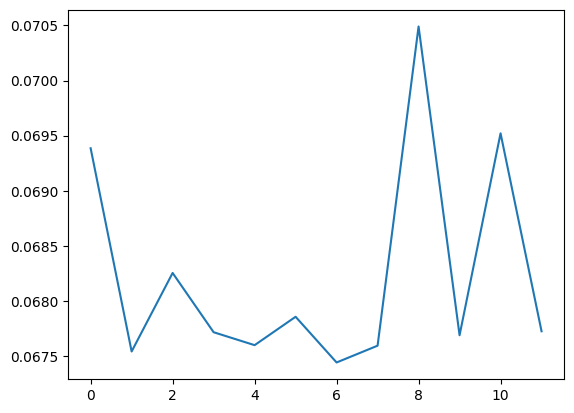

bryuf
torch.Size([161, 50])
loss
0.06720836460590363
output
tensor([[0.5106, 0.4894]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


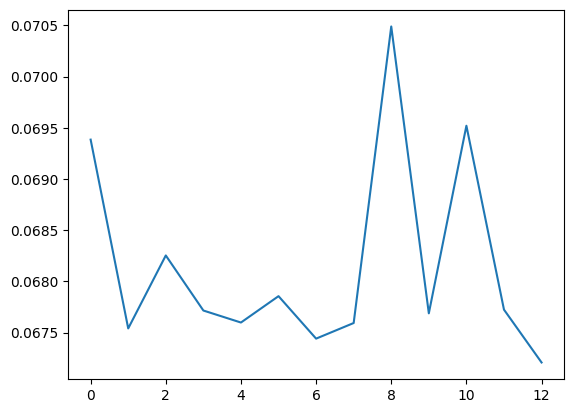

bryuf
torch.Size([193, 50])
loss
0.06904850155115128
output
tensor([[0.4987, 0.5013]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


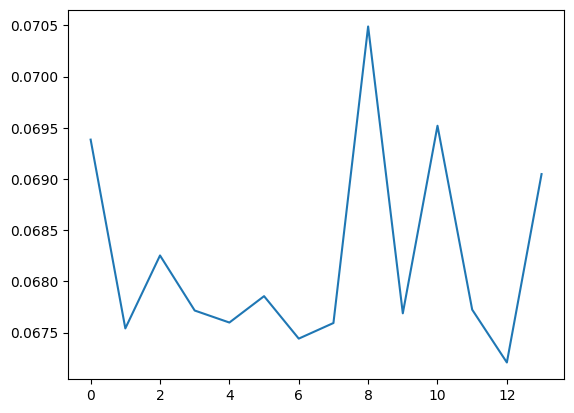

bryuf
torch.Size([123, 50])
loss
0.06777035444974899
output
tensor([[0.5078, 0.4922]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


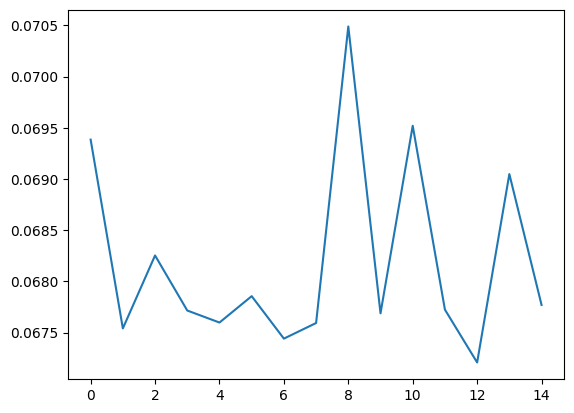

bryuf
torch.Size([140, 50])
loss
0.06753287464380264
output
tensor([[0.5090, 0.4910]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


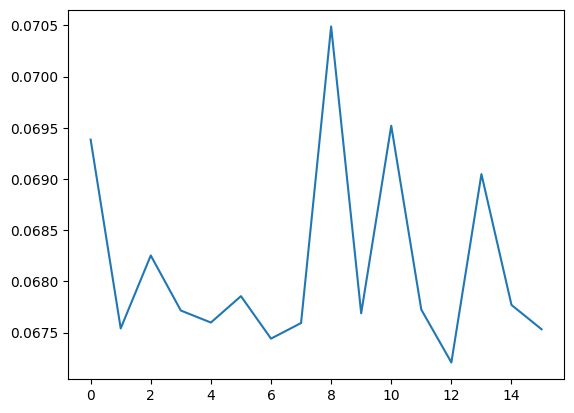

bryuf
torch.Size([288, 50])
loss
0.07097876071929932
output
tensor([[0.5083, 0.4917]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


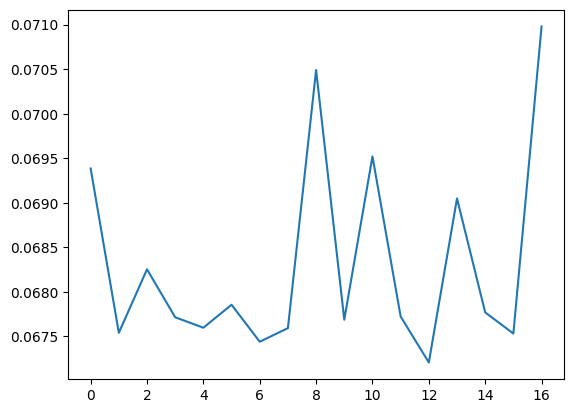

bryuf
torch.Size([191, 50])
loss
0.06751509755849838
output
tensor([[0.5091, 0.4909]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


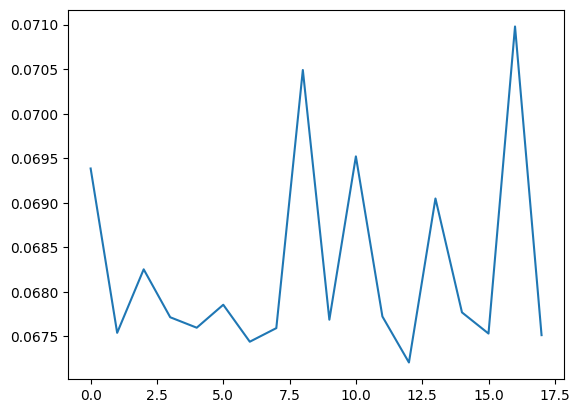

bryuf
torch.Size([183, 50])
loss
0.06753986328840256
output
tensor([[0.5090, 0.4910]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


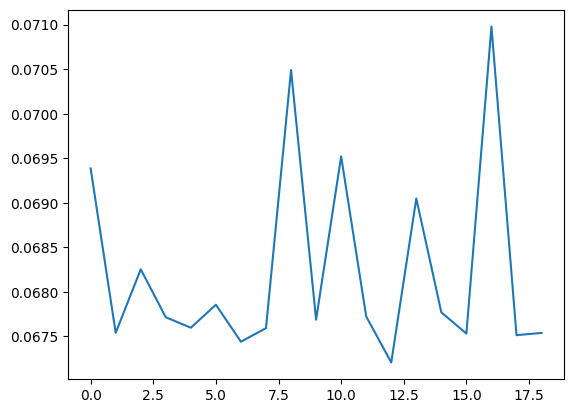

bryuf
torch.Size([331, 50])
loss
0.06750817596912384
output
tensor([[0.5091, 0.4909]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


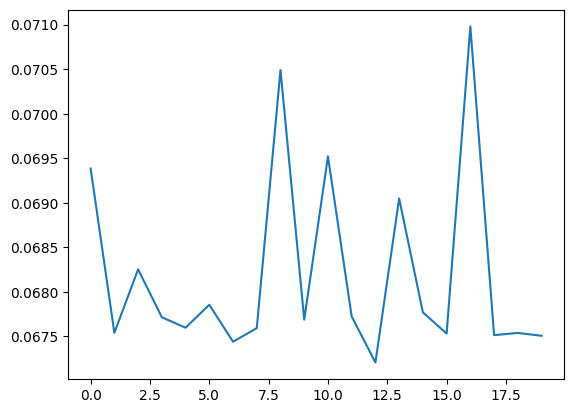

bryuf
torch.Size([131, 50])
loss
0.07102750986814499
output
tensor([[0.5085, 0.4915]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


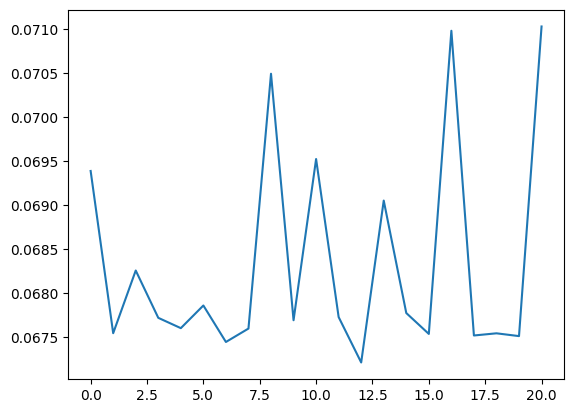

bryuf
torch.Size([253, 50])
loss
0.06776762008666992
output
tensor([[0.5078, 0.4922]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


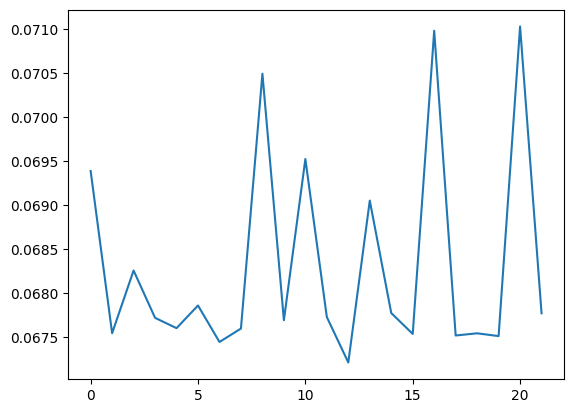

bryuf
torch.Size([228, 50])
loss
0.0708920955657959
output
tensor([[0.5078, 0.4922]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


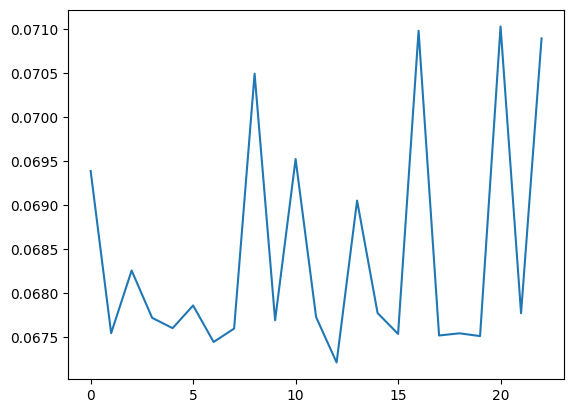

bryuf
torch.Size([303, 50])
loss
0.06772183626890182
output
tensor([[0.5080, 0.4920]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


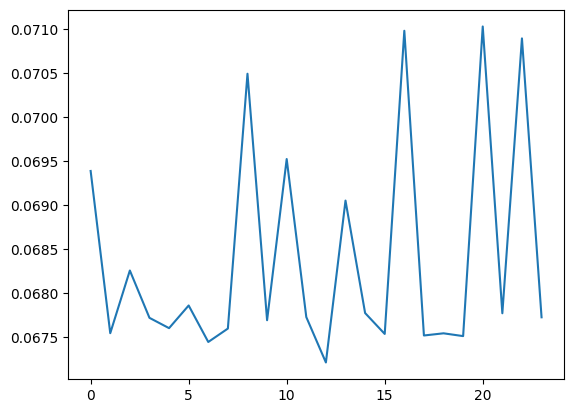

bryuf
torch.Size([419, 50])
loss
0.07091670483350754
output
tensor([[0.5079, 0.4921]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


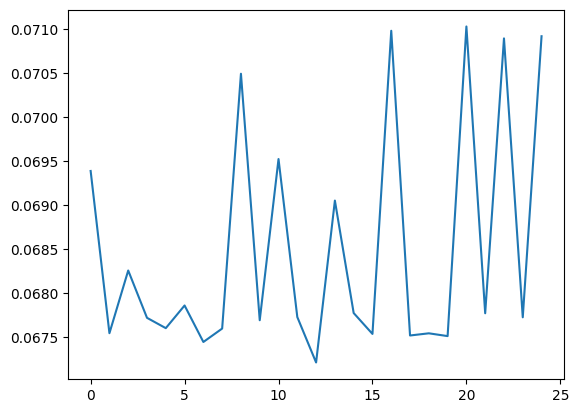

bryuf
torch.Size([215, 50])
loss
0.06711182743310928
output
tensor([[0.5111, 0.4889]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


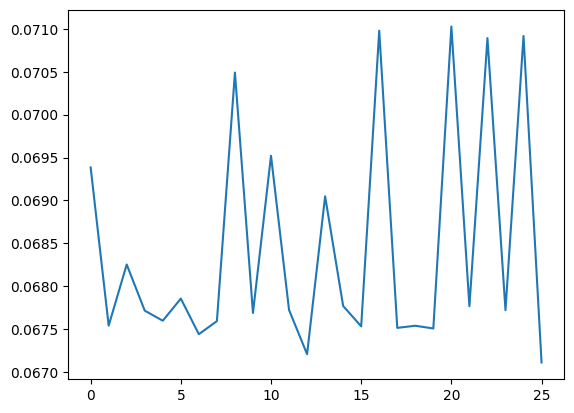

bryuf
torch.Size([158, 50])
loss
0.06756095588207245
output
tensor([[0.5088, 0.4912]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


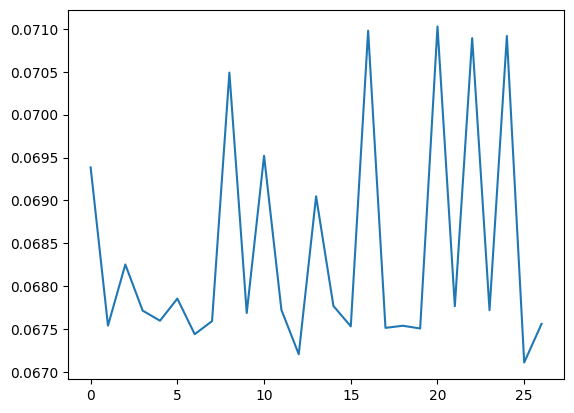

bryuf
torch.Size([281, 50])
loss
0.07093160599470139
output
tensor([[0.5080, 0.4920]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


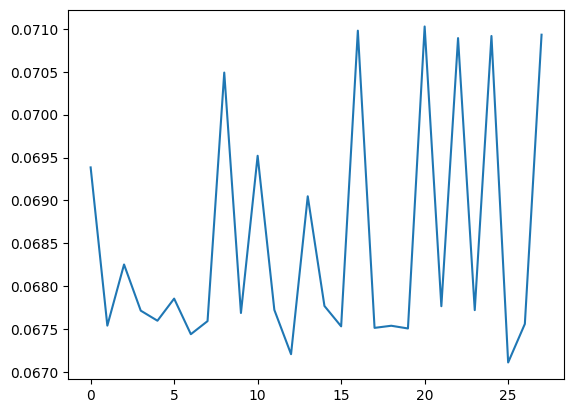

bryuf
torch.Size([431, 50])
loss
0.0707959309220314
output
tensor([[0.5074, 0.4926]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


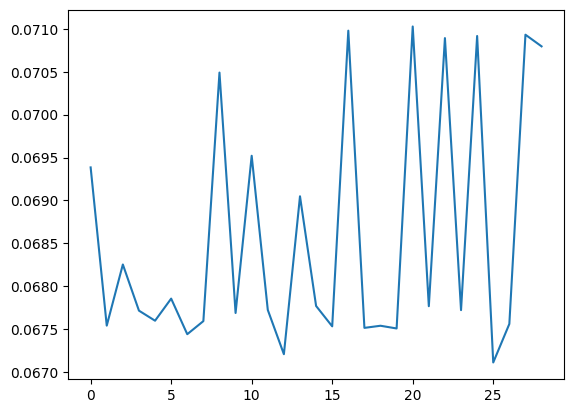

bryuf
torch.Size([387, 50])
loss
0.07115917652845383
output
tensor([[0.5091, 0.4909]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


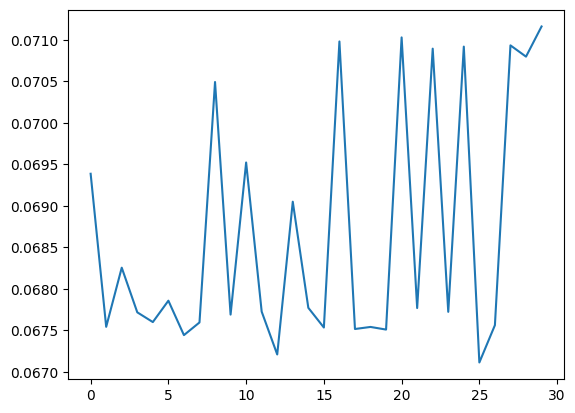

bryuf
torch.Size([185, 50])
loss
0.07124408334493637
output
tensor([[0.5096, 0.4904]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


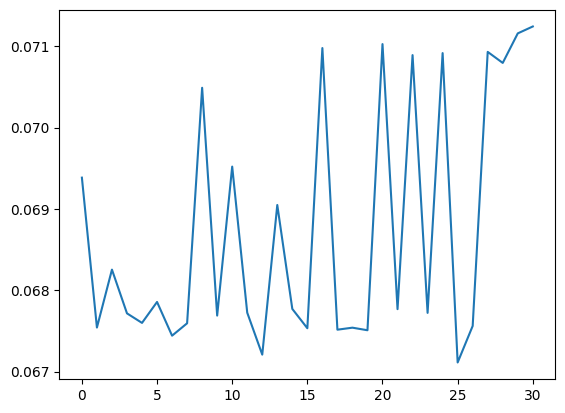

bryuf
torch.Size([173, 50])
loss
0.07093597948551178
output
tensor([[0.5080, 0.4920]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


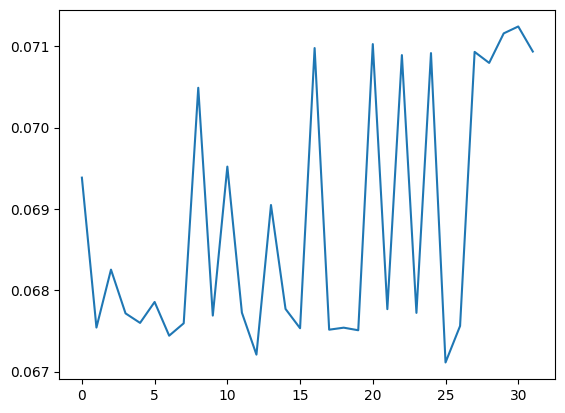

bryuf
torch.Size([112, 50])
loss
0.07100941985845566
output
tensor([[0.5084, 0.4916]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


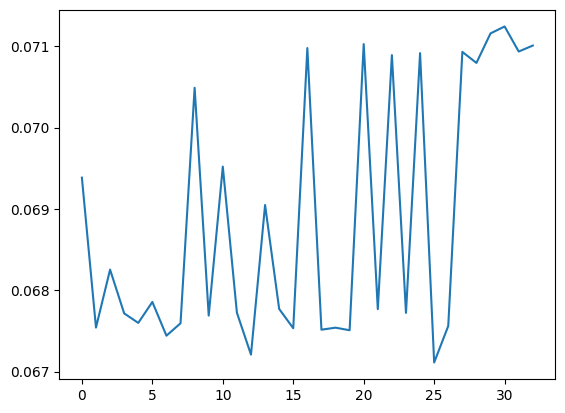

bryuf
torch.Size([260, 50])
loss
0.07102217525243759
output
tensor([[0.5085, 0.4915]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


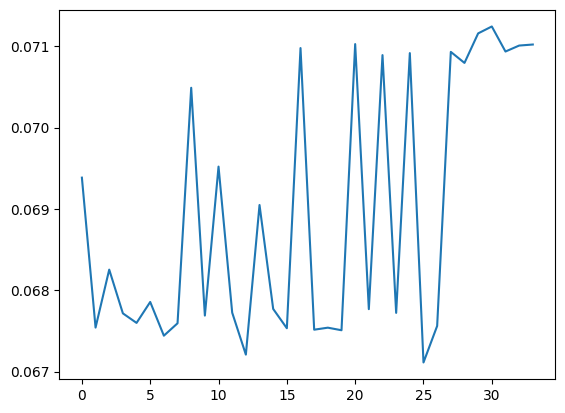

bryuf
torch.Size([197, 50])
loss
0.06789381802082062
output
tensor([[0.5072, 0.4928]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


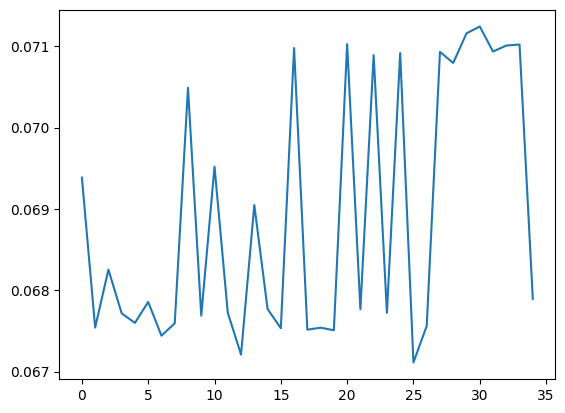

bryuf
torch.Size([195, 50])
loss
0.06962967664003372
output
tensor([[0.4984, 0.5016]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


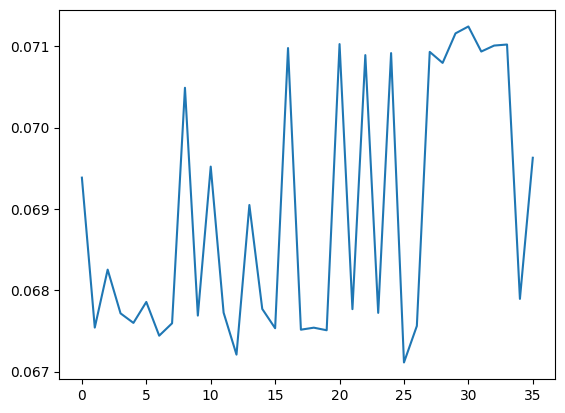

bryuf
torch.Size([369, 50])
loss
0.07123275101184845
output
tensor([[0.5095, 0.4905]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


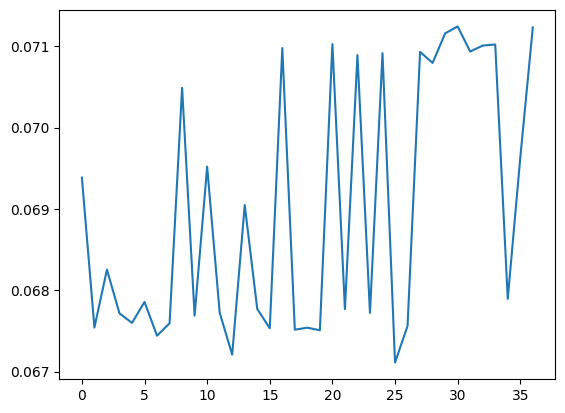

bryuf
torch.Size([121, 50])
loss
0.07093250006437302
output
tensor([[0.5080, 0.4920]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


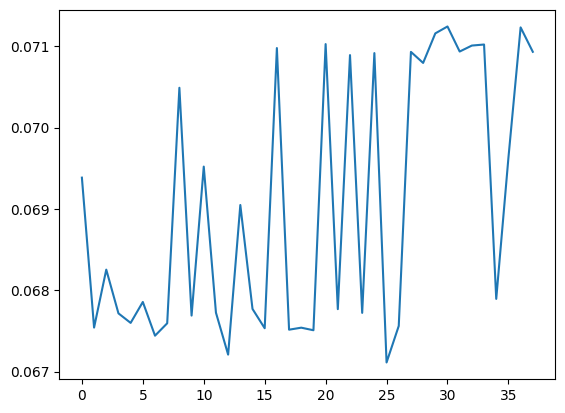

bryuf
torch.Size([318, 50])
loss
0.0680539608001709
output
tensor([[0.5063, 0.4937]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


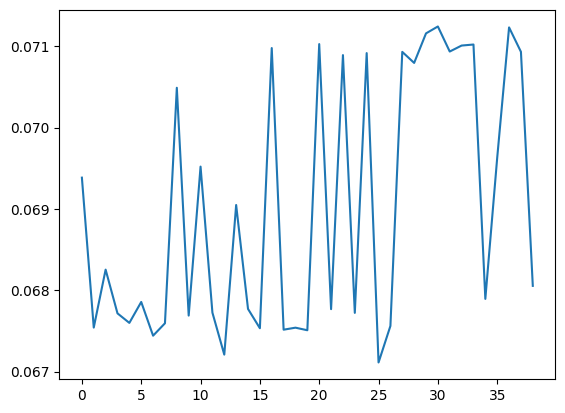

bryuf
torch.Size([189, 50])
loss
0.06783805042505264
output
tensor([[0.5074, 0.4926]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


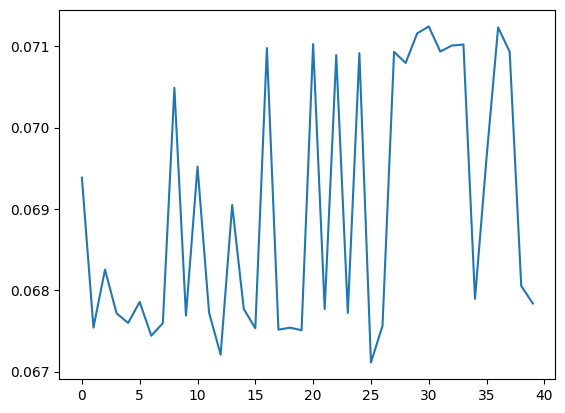

bryuf
torch.Size([159, 50])
loss
0.0713462084531784
output
tensor([[0.5101, 0.4899]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


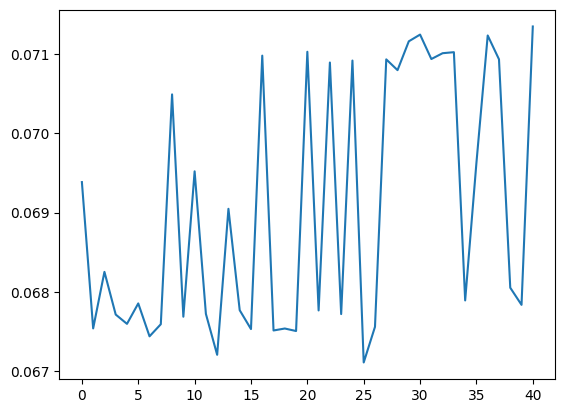

bryuf
torch.Size([278, 50])
loss
0.07063546776771545
output
tensor([[0.5066, 0.4934]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


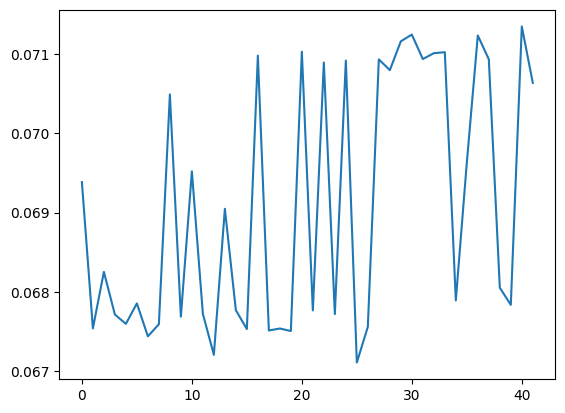

bryuf
torch.Size([177, 50])
loss
0.07118812948465347
output
tensor([[0.5093, 0.4907]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


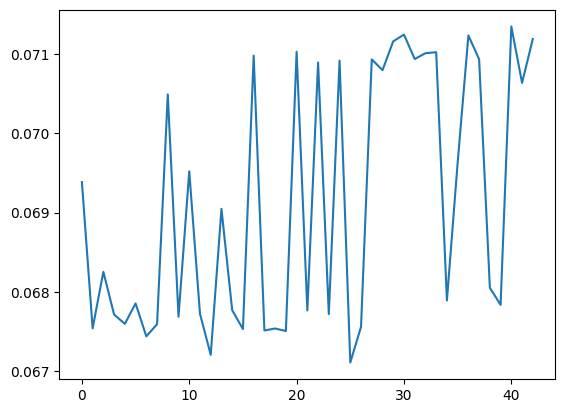

bryuf
torch.Size([102, 50])
loss
0.06741464883089066
output
tensor([[0.5096, 0.4904]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


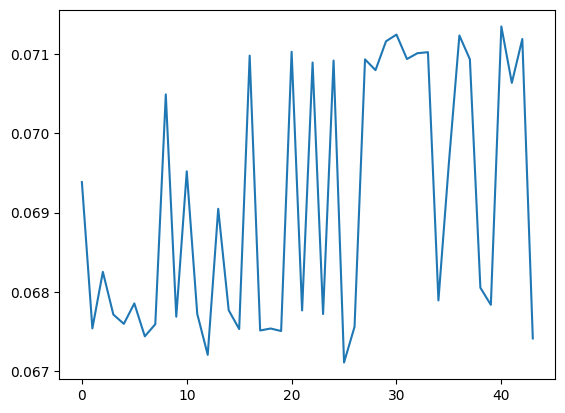

bryuf
torch.Size([126, 50])
loss
0.0708061084151268
output
tensor([[0.5074, 0.4926]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


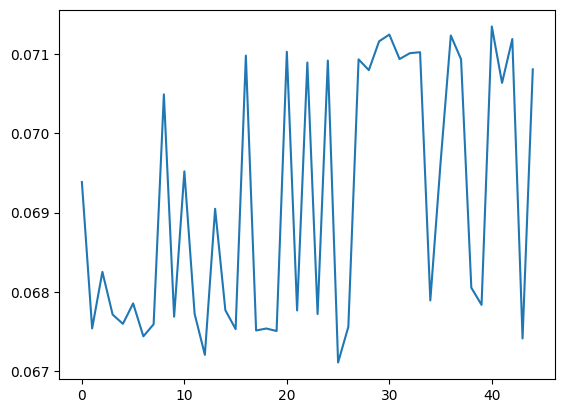

bryuf
torch.Size([201, 50])
loss
0.07109858840703964
output
tensor([[0.5088, 0.4912]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


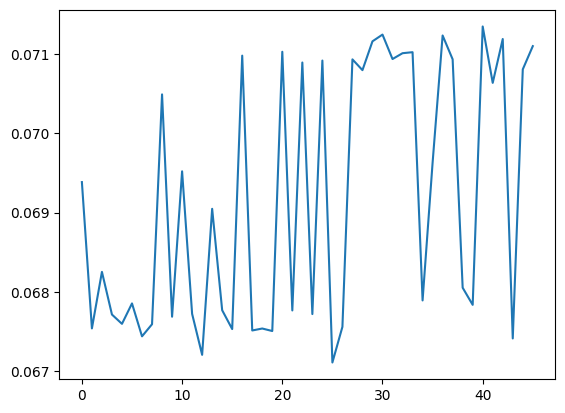

bryuf
torch.Size([275, 50])
loss
0.06750926375389099
output
tensor([[0.5091, 0.4909]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


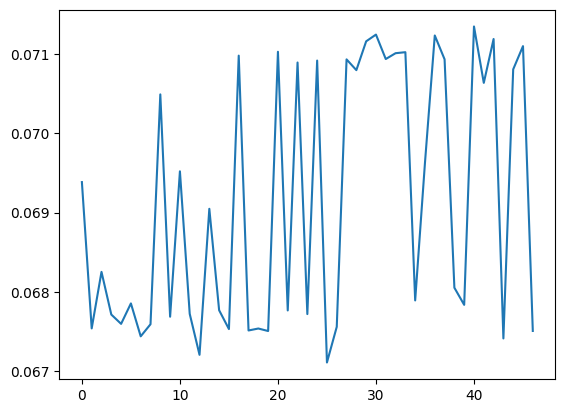

bryuf
torch.Size([119, 50])
loss
0.06763402372598648
output
tensor([[0.5085, 0.4915]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


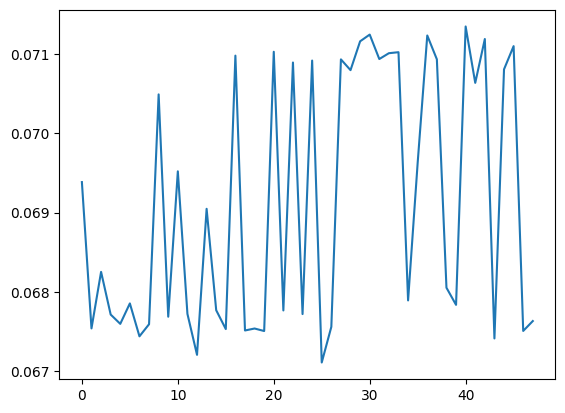

bryuf
torch.Size([355, 50])
loss
0.06797275692224503
output
tensor([[0.5068, 0.4932]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


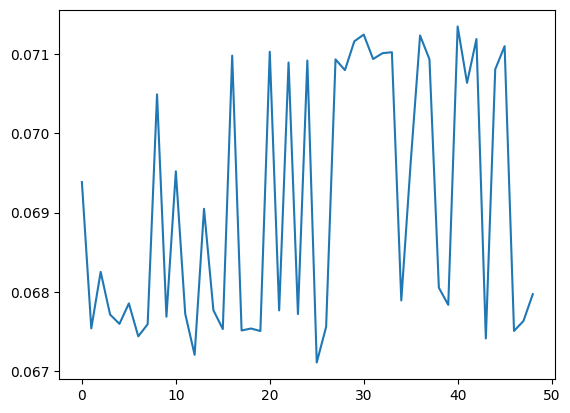

bryuf
torch.Size([309, 50])
loss
0.0714302733540535
output
tensor([[0.5105, 0.4895]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


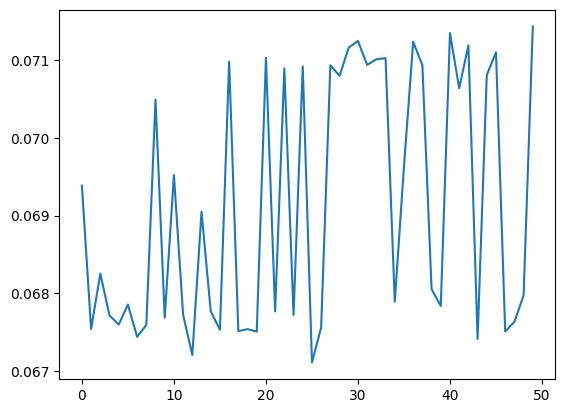

bryuf
torch.Size([345, 50])
loss
0.06941839307546616
output
tensor([[0.4995, 0.5005]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


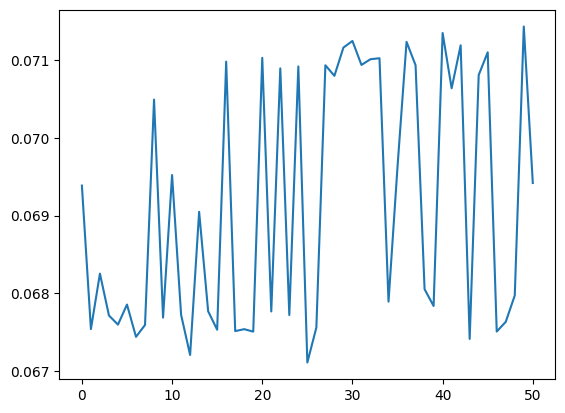

bryuf
torch.Size([215, 50])
loss
0.06759512424468994
output
tensor([[0.5087, 0.4913]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


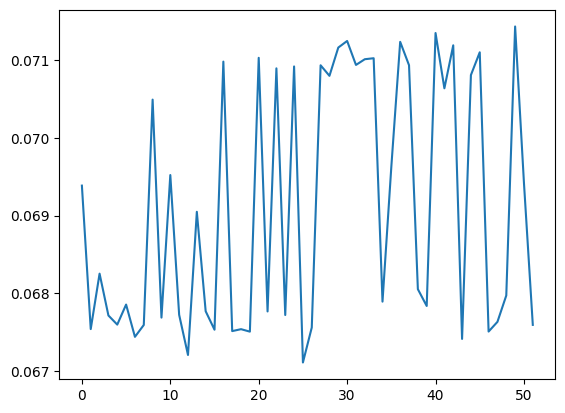

bryuf
torch.Size([380, 50])
loss
0.06954832375049591
output
tensor([[0.4988, 0.5012]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


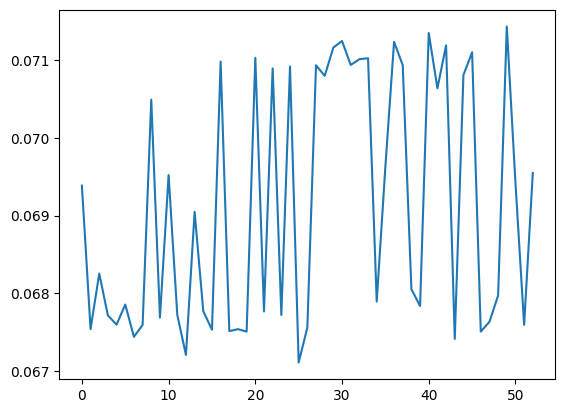

bryuf
torch.Size([434, 50])
loss
0.06742732971906662
output
tensor([[0.5095, 0.4905]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


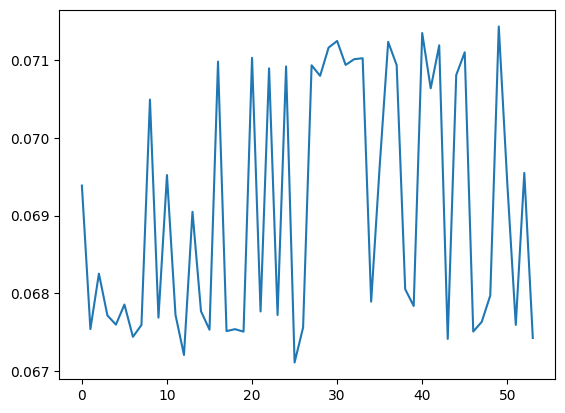

bryuf
torch.Size([99, 50])
loss
0.07146133482456207
output
tensor([[0.5106, 0.4894]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


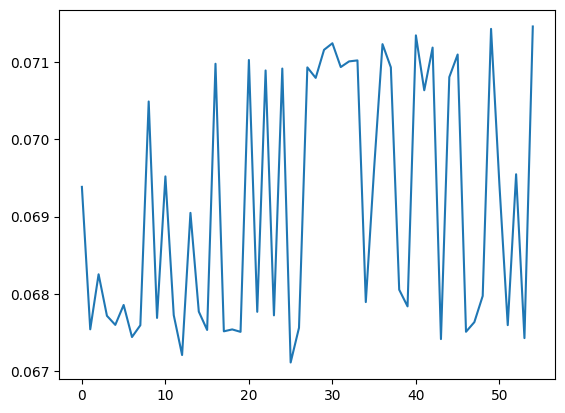

bryuf
torch.Size([333, 50])
loss
0.06767766922712326
output
tensor([[0.5083, 0.4917]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


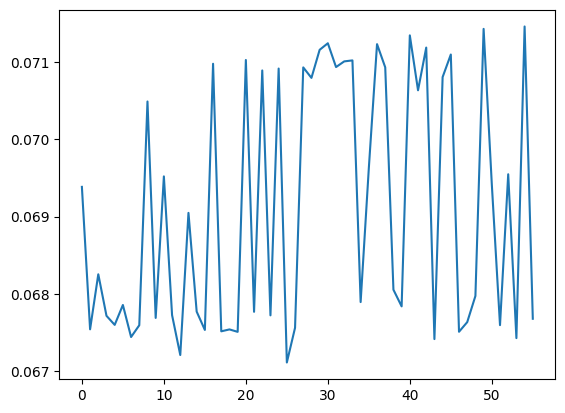

bryuf
torch.Size([203, 50])
loss
0.06708910316228867
output
tensor([[0.5113, 0.4887]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


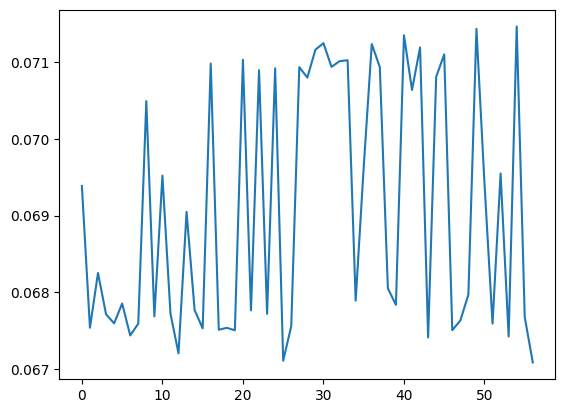

bryuf
torch.Size([229, 50])
loss
0.07072295248508453
output
tensor([[0.5070, 0.4930]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


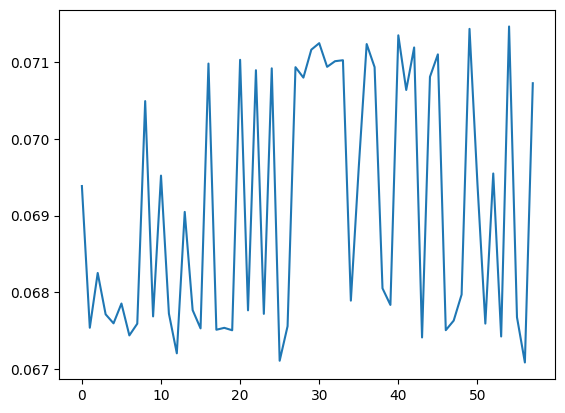

bryuf
torch.Size([504, 50])
loss
0.06768373399972916
output
tensor([[0.5082, 0.4918]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


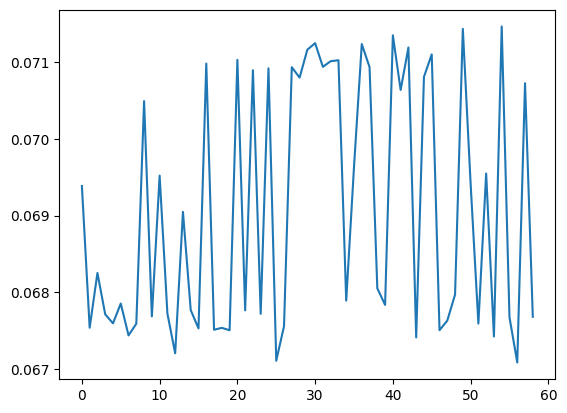

bryuf
torch.Size([310, 50])
loss
0.070560522377491
output
tensor([[0.5062, 0.4938]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


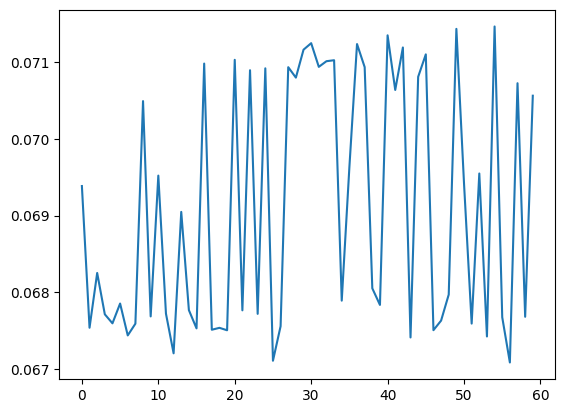

bryuf
torch.Size([199, 50])
loss
0.06786567717790604
output
tensor([[0.5073, 0.4927]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


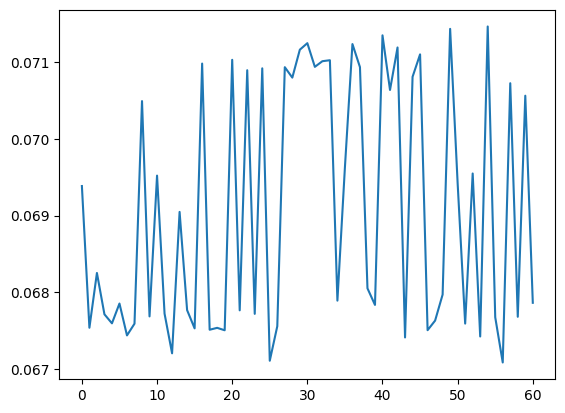

bryuf
torch.Size([308, 50])
loss
0.07085543125867844
output
tensor([[0.5076, 0.4924]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


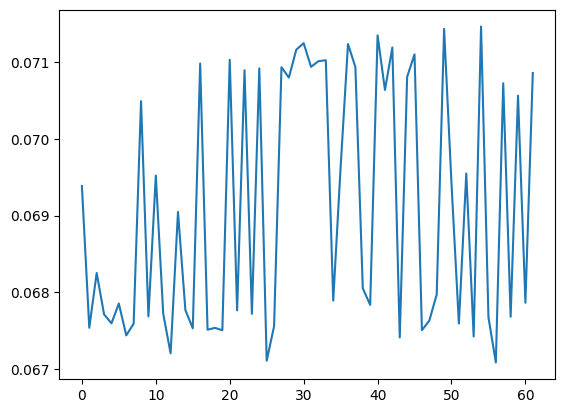

bryuf
torch.Size([274, 50])
loss
0.06962660700082779
output
tensor([[0.4984, 0.5016]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


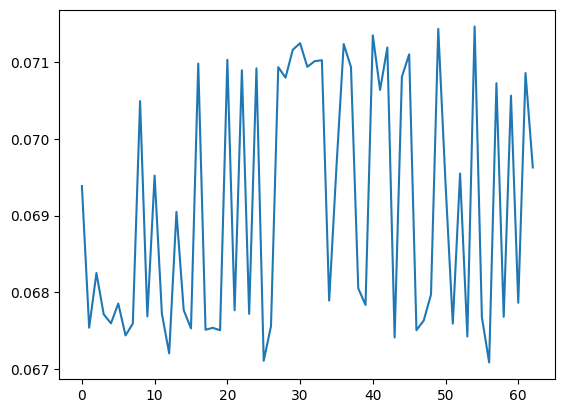

bryuf
torch.Size([104, 50])
loss
0.07121483236551285
output
tensor([[0.5094, 0.4906]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


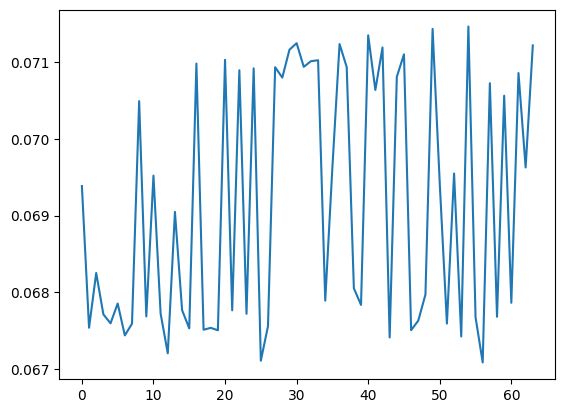

bryuf
torch.Size([367, 50])
loss
0.06944433599710464
output
tensor([[0.4994, 0.5006]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


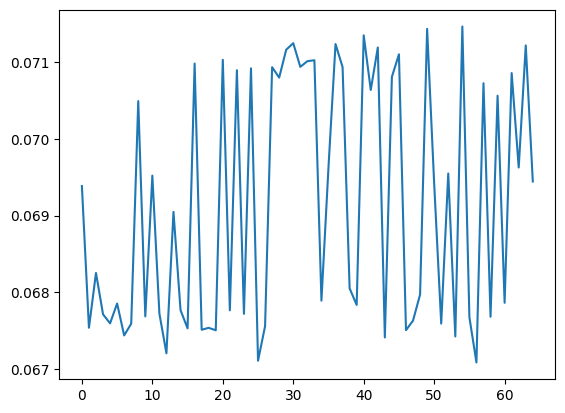

bryuf
torch.Size([137, 50])
loss
0.07104947417974472
output
tensor([[0.5086, 0.4914]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


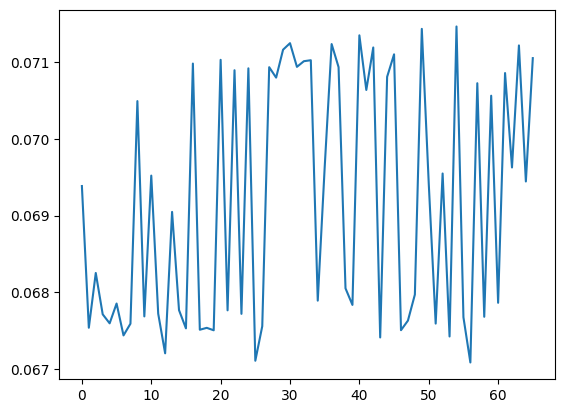

bryuf
torch.Size([134, 50])
loss
0.07073994725942612
output
tensor([[0.5071, 0.4929]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


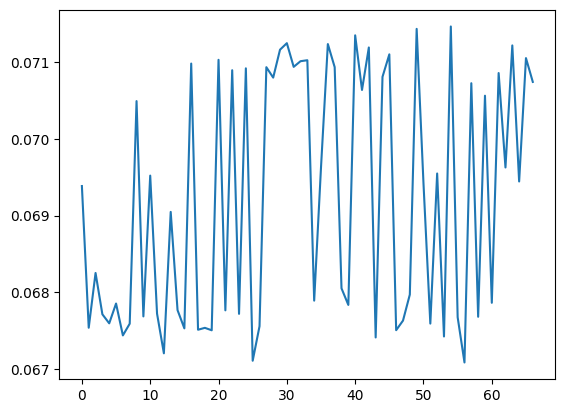

bryuf
torch.Size([257, 50])
loss
0.06757984310388565
output
tensor([[0.5088, 0.4912]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


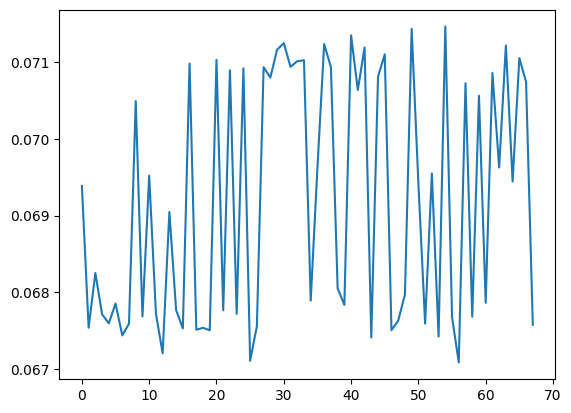

bryuf
torch.Size([126, 50])
loss
0.06713749468326569
output
tensor([[0.5110, 0.4890]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


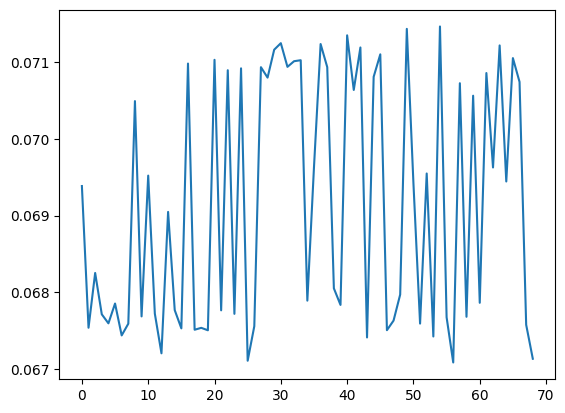

bryuf
torch.Size([244, 50])
loss
0.0678163394331932
output
tensor([[0.5075, 0.4925]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


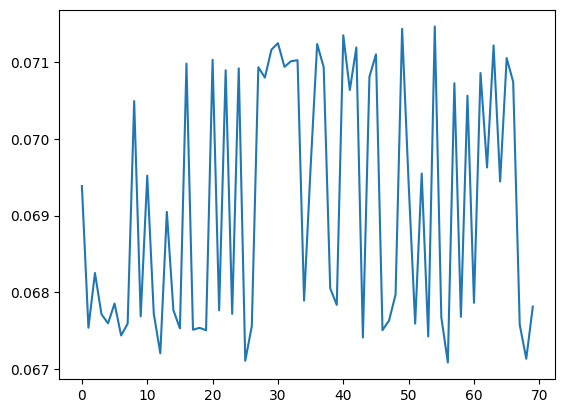

bryuf
torch.Size([377, 50])
loss
0.07092165946960449
output
tensor([[0.5080, 0.4920]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


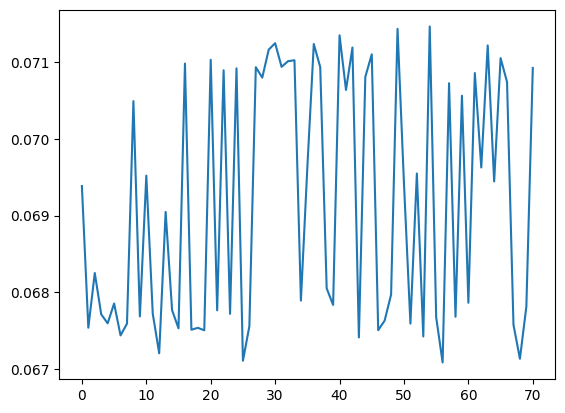

bryuf
torch.Size([180, 50])
loss
0.07132524996995926
output
tensor([[0.5100, 0.4900]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


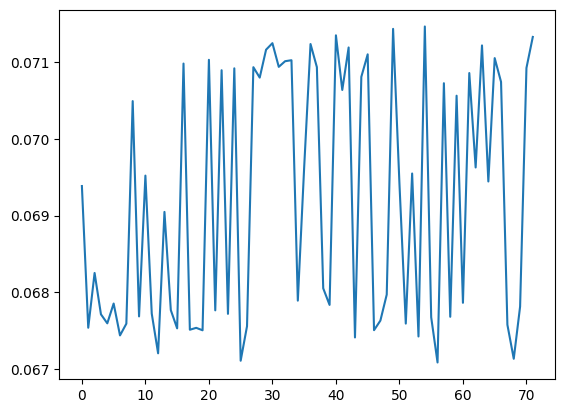

bryuf
torch.Size([118, 50])
loss
0.06751254200935364
output
tensor([[0.5091, 0.4909]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


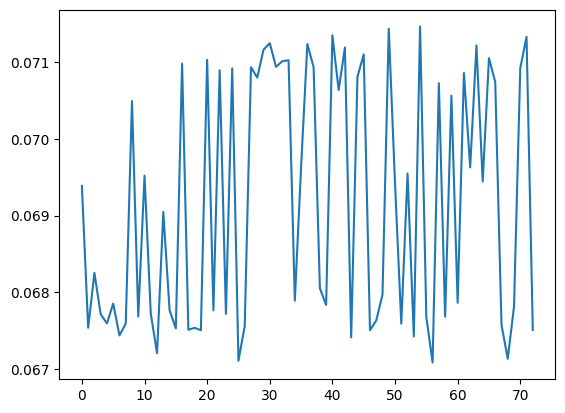

bryuf
torch.Size([210, 50])
loss
0.07174128293991089
output
tensor([[0.5120, 0.4880]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


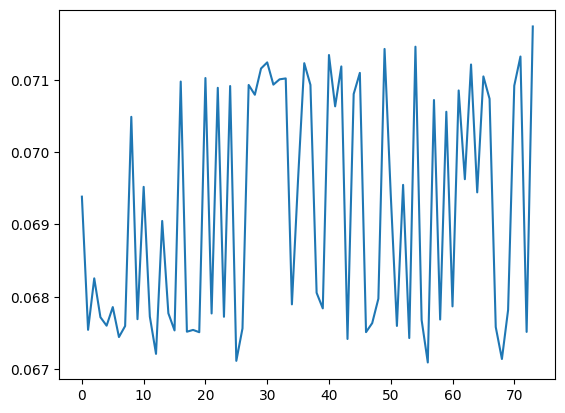

bryuf
torch.Size([340, 50])
loss
0.07086014002561569
output
tensor([[0.5077, 0.4923]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


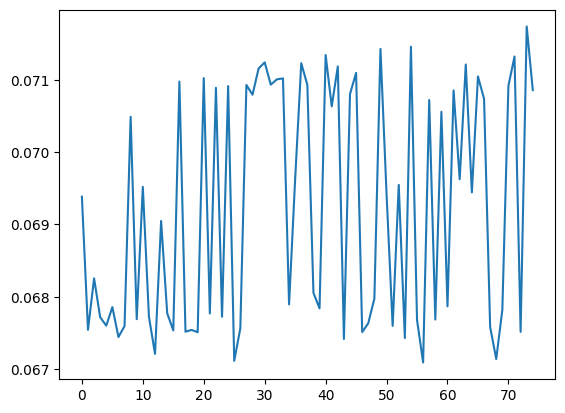

bryuf
torch.Size([134, 50])
loss
0.07111767679452896
output
tensor([[0.5089, 0.4911]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


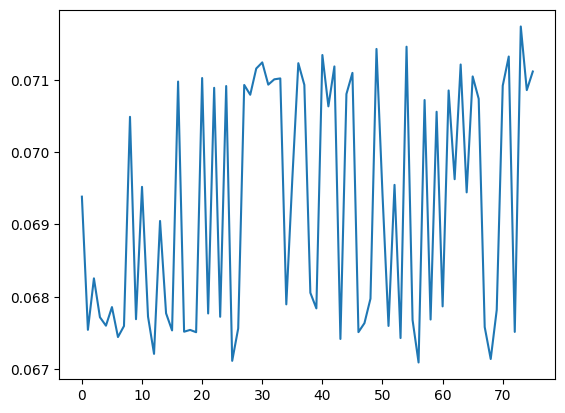

bryuf
torch.Size([197, 50])
loss
0.07128214091062546
output
tensor([[0.5097, 0.4903]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


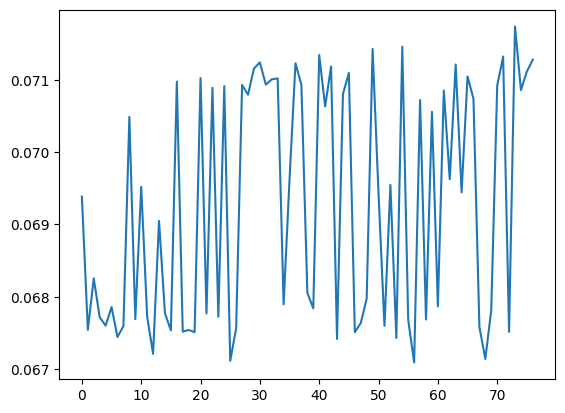

bryuf
torch.Size([199, 50])
loss
0.07114863395690918
output
tensor([[0.5091, 0.4909]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


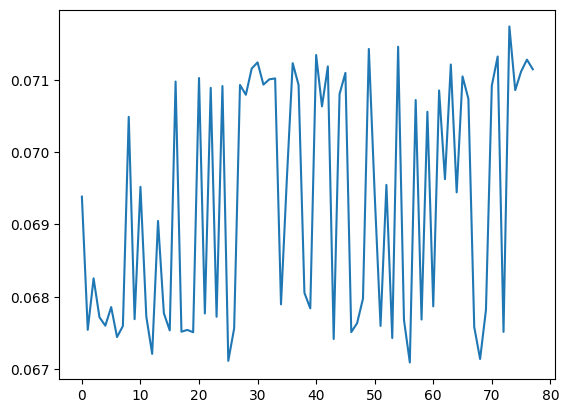

bryuf
torch.Size([143, 50])
loss
0.07106485962867737
output
tensor([[0.5087, 0.4913]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


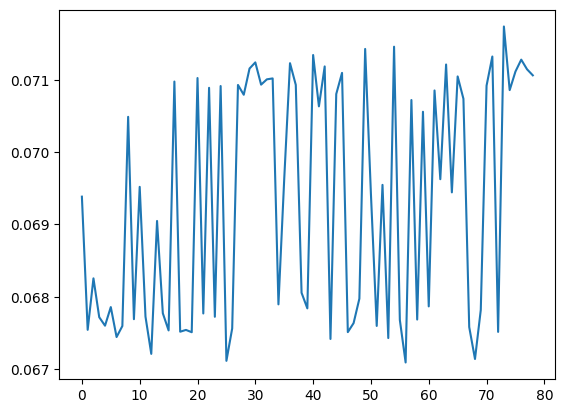

bryuf
torch.Size([132, 50])
loss
0.0712607130408287
output
tensor([[0.5096, 0.4904]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


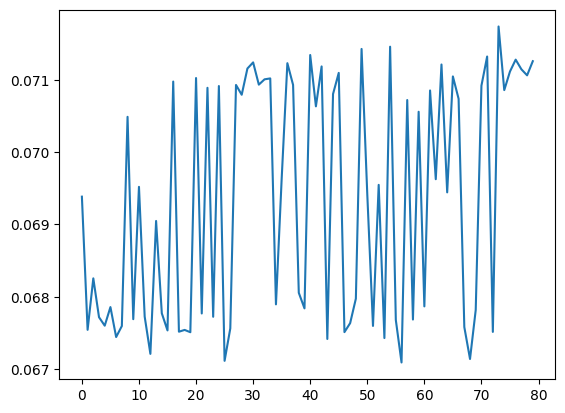

bryuf
torch.Size([116, 50])
loss
0.07139980047941208
output
tensor([[0.5103, 0.4897]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


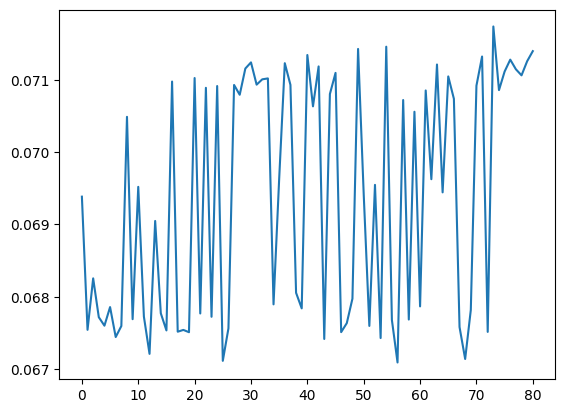

bryuf
torch.Size([144, 50])
loss
0.07142046838998795
output
tensor([[0.5104, 0.4896]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


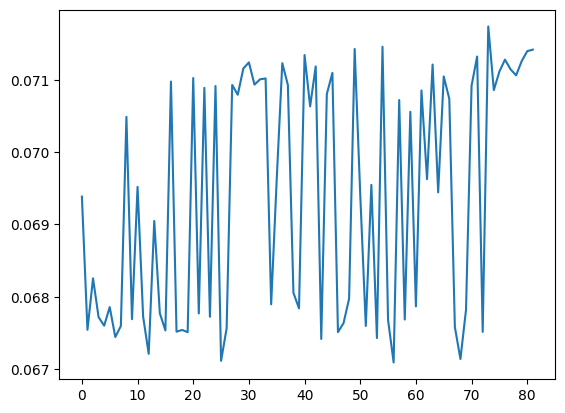

bryuf
torch.Size([205, 50])
loss
0.0676082968711853
output
tensor([[0.5086, 0.4914]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


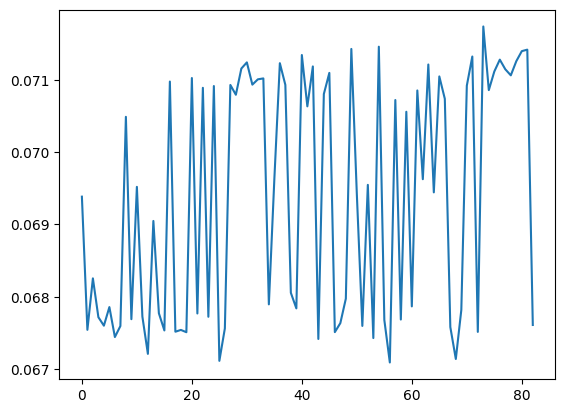

bryuf
torch.Size([330, 50])
loss
0.06735407561063766
output
tensor([[0.5099, 0.4901]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


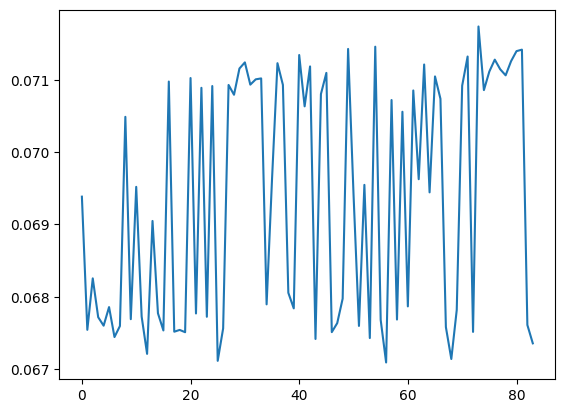

bryuf
torch.Size([290, 50])
loss
0.07055611163377762
output
tensor([[0.5062, 0.4938]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


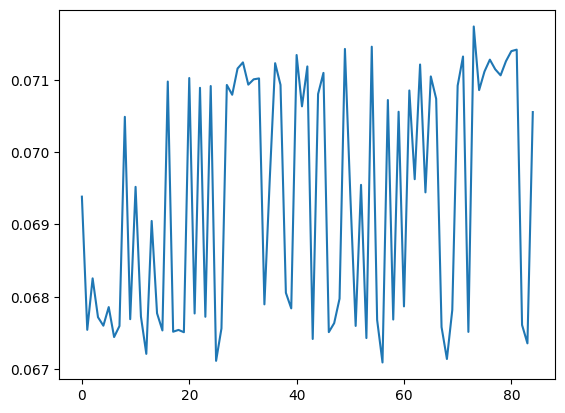

bryuf
torch.Size([296, 50])
loss
0.06760989874601364
output
tensor([[0.5086, 0.4914]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


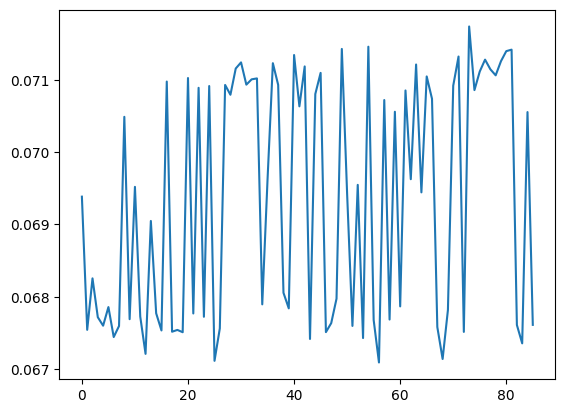

bryuf
torch.Size([282, 50])
loss
0.06788530200719833
output
tensor([[0.5072, 0.4928]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


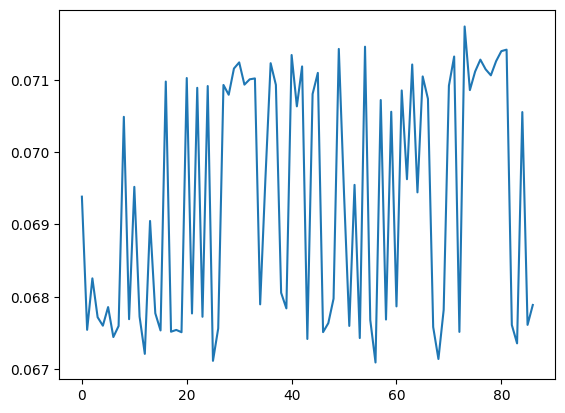

bryuf
torch.Size([398, 50])
loss
0.06739584356546402
output
tensor([[0.5097, 0.4903]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


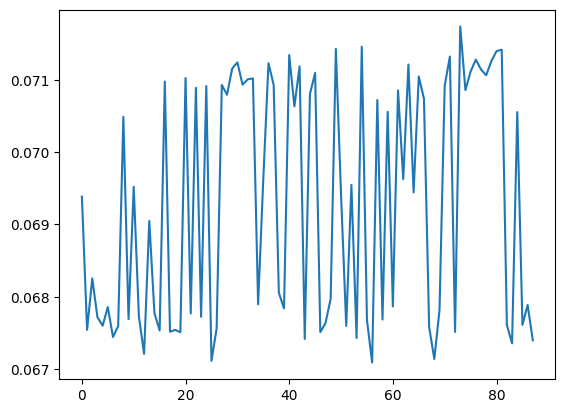

bryuf
torch.Size([105, 50])
loss
0.06786169856786728
output
tensor([[0.5073, 0.4927]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


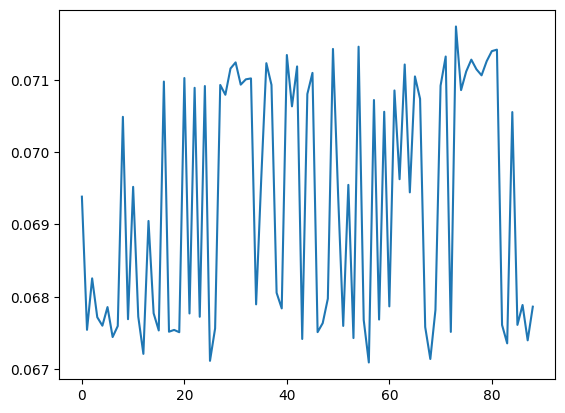

bryuf
torch.Size([170, 50])
loss
0.07087941467761993
output
tensor([[0.5078, 0.4922]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


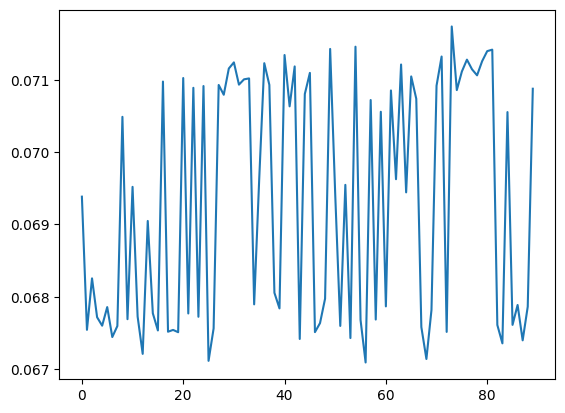

bryuf
torch.Size([150, 50])
loss
0.06782030314207077
output
tensor([[0.5075, 0.4925]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


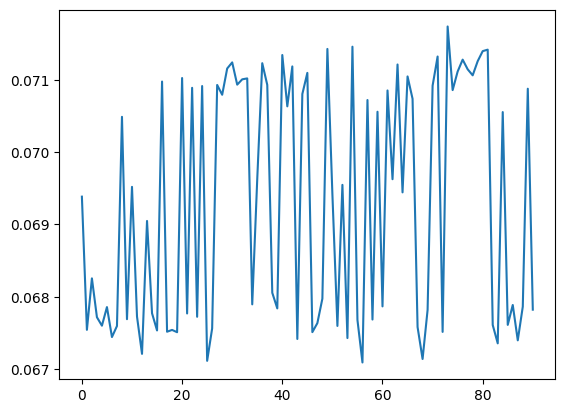

bryuf
torch.Size([101, 50])
loss
0.06748129427433014
output
tensor([[0.5093, 0.4907]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


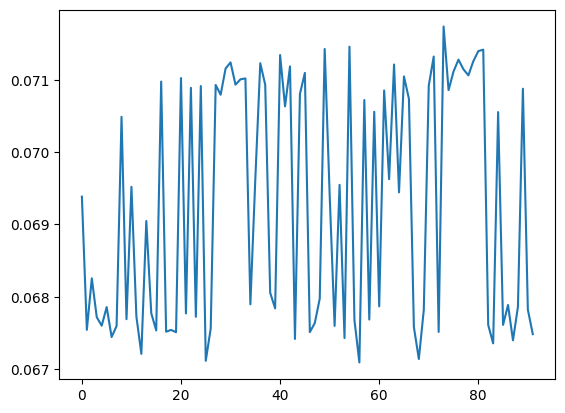

bryuf
torch.Size([176, 50])
loss
0.0677320584654808
output
tensor([[0.5080, 0.4920]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


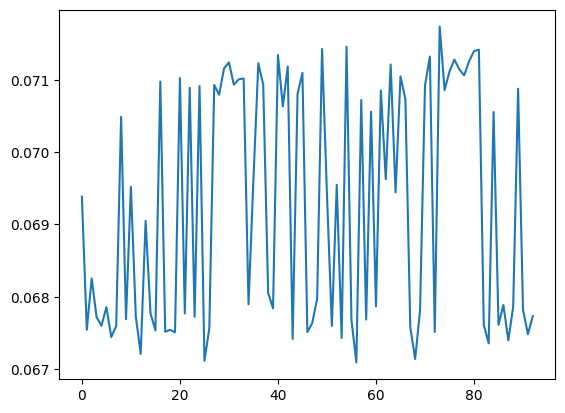

bryuf
torch.Size([275, 50])
loss
0.07130491733551025
output
tensor([[0.5099, 0.4901]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[0., 1.]])


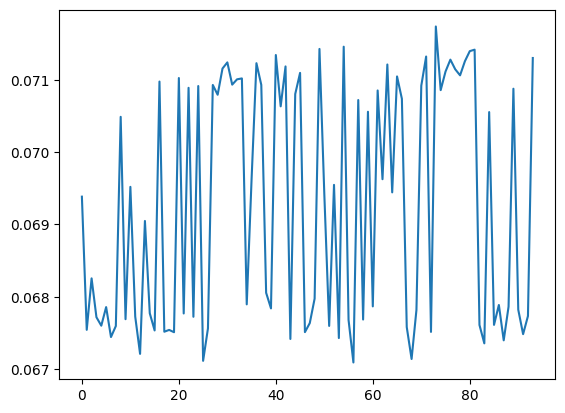

bryuf
torch.Size([585, 50])
loss
0.0679030790925026
output
tensor([[0.5071, 0.4929]], grad_fn=<UnsqueezeBackward0>)
logit
tensor([[1., 0.]])


KeyboardInterrupt: 

In [ ]:
#train
optimizer=torch.optim.Adam(model.parameters(),lr=0.0001)
criterion=torch.nn.BCELoss()
epochs=10000
losses=[]
batchsize=10
for i in range(epochs):

  _,seq,logit=env.act()
  seq=torch.tensor(seq).unsqueeze(0)
  logit=torch.tensor(logit).unsqueeze(0).float()
  output=model(seq).unsqueeze(0)
  loss=criterion(output,logit)/batchsize
  loss.backward()
  losses.append(loss.item())
  print("loss")
  print(loss.item())
  print("output")
  print(output)
  print("logit")
  print(logit)
  plt.plot(losses)
  plt.show()
  #
  #save grad
  with open("grad.txt","a") as f:
    for name, param in model.named_parameters():
      if param.grad is not None:
        #filter 0 grad
        if param.grad.norm()==0:
          continue
        f.write(f"{name}: {param.grad}\n")
  if i%batchsize==0:
    #clip grad
    #torch.nn.utils.clip_grad_norm_(model.parameters(), 1)
    optimizer.step()
    optimizer.zero_grad()

  if i%100==0:
    #save model
    clear_output()
  if len(losses)==100:
    #get mean
    losses=np.mean(losses)
    losses=[losses]







In [ ]:
#save model
torch.save(model.state_dict(),"models15reduceddropout.pt")


In [ ]:
#load model
model.load_state_dict(torch.load("blyat.pt"))

<ipython-input-22-493f3c4c3413>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("blyat.pt"))


<All keys matched successfully>

In [ ]:
#test
model.eval()
_,seq,logit=env.act()
seq=torch.tensor(seq).unsqueeze(0)
output=model(seq)
print(output)

tensor([[0.6014, 0.3986]], grad_fn=<SoftmaxBackward0>)


In [ ]:
#text2="In the story, Subaru Natsuki is an ordinary high school student who is lost in an alternate world, where he is rescued by a beautiful, silver-haired girl. He stays near her to return the favor, but the destiny she is burdened with is more than Subaru can imagine. Enemies attack one by one, and both of them are killed. He then finds out he has the power to rewind death, back to the time he first came to this world. But only he remembers what has happened since."
#text1="It is the Taisho Period in Japan. Tanjiro, a kindhearted boy who sells charcoal for a living, finds his family slaughtered by a demon. To make matters worse, his younger sister Nezuko, the sole survivor, has been transformed into a demon herself. Though devastated by this grim reality, Tanjiro resolves to become a “demon slayer” so that he can turn his sister back into a human, and kill the demon that massacred his family."
#text1="a boy who losses all his family because of a demon and only his sister survives the attack"
#text1="a squad of pirates that goes for adventures on the sea the first pirate, luffy, was raised for another pirate that was later executed"
#text1="a story about a girl and a boy, the boy plays piano and  the girl the violin, he tries to overcome his traumas and the girl tries to help him to become a better person"
#text2="Ever since the death of his father, the burden of supporting the family has fallen upon Tanjirou Kamado's shoulders. Though living impoverished on a remote mountain, the Kamado family are able to enjoy a relatively peaceful and happy life. One day, Tanjirou decides to go down to the local village to make a little money selling charcoal. On his way back, night falls, forcing Tanjirou to take shelter in the house of a strange man, who warns him of the existence of flesh-eating demons that lurk in the woods at night.When he finally arrives back home the next day, he is met with a horrifying sight—his whole family has been slaughtered. Worse still, the sole survivor is his sister Nezuko, who has been turned into a bloodthirsty demon. Consumed by rage and hatred, Tanjirou swears to avenge his family and stay by his only remaining sibling. Alongside the mysterious group calling themselves the Demon Slayer Corps, Tanjirou will do whatever it takes to slay the demons and protect the remnants of his beloved sister's humanity."
#text2="The protagonist, Naoya, is a first-year in high school. He asks out Saki, a girl he has been in love with, and she agrees to be his girlfriend. He's currently on cloud nine. But then, a beautiful girl named Nagisa comes up to Naoya one day and tells him that she wants to go out with him. Naoya feels himself wavering because Nagisa is such a good girl, and he comes to a decision! A new kind of romcom from a rather unexpected decision is about to begin!"
#text2="Civilization is dead, but Chito and Yuuri are still alive. So they hop aboard their beloved Kettenkrad motorbike and aimlessly wander the ruins of the world they once knew. Day after hopeless day, they look for their next meal and fuel for their ride. But as long as the two are together, even an existence as bleak as theirs has a ray or two of sunshine in it, whether they're sucking down their fill of soup or hunting for machine parts to tinker with."
#text2="One night, 14-year-old Madoka Kaname has a terrible nightmare - against the backdrop of a devastated city, she witnesses a girl fight a losing battle against a dreadful being lingering above, while a cat-like magical creature tells Madoka the only way to change such tragic outcome is for her to make a contract with him and become a magical girl."
#text1="Dr. Kenzo Tenma is a renowned Japanese brain surgeon working at a leading hospital in Germany. One night, Dr. Tenma risks his reputation and career to save the life of a critically wounded young boy over that of the town mayor who had been planning to support the hospital financially. A string of mysterious murders begin to occur soon after the operation, and Dr. Tenma emerges as the primary suspect despite no incriminating evidence."
#text1="There's a rumor about a mysterious phenomenon called puberty syndrome. For example, Sakuta Azusagawa is a high school student who suddenly sees a bunny girl appear in front of him. The girl is actually a girl named Mai Sakurajima, who is Sakuta's upperclassman who is also a famous actress who has gone on hiatus from the entertainment industry. For some reason, the people around Mai cannot see her bunny-girl figure. Sakuta sets out to solve this mystery, and as he spends time with Mai, he learns her secret feelings. Other heroines who have puberty syndrome start to appear in front of Sakuta."
#text1="Punpun Onodera is a normal 11-year-old boy living in Japan. Hopelessly idealistic and romantic, Punpun begins to see his life take a subtle—though nonetheless startling—turn to the adult when he meets the new girl in his class, Aiko Tanaka. It is then that the quiet boy learns just how fickle maintaining a relationship can be, and the surmounting difficulties of transitioning from a naive boyhood to a convoluted adulthood. When his father assaults his mother one night, Punpun realizes another thing: those whom he looked up to were not as impressive as he once thought."
#text2="Oyasumi Punpun ( lit. Punpun) is a seinen manga about the life of a young boy named Punpun, stylized as a bird doodle, who can summon God by, Dear God, dear God, tinkle tinkle hoy! The story follows him from elementary school through his twenties as he struggles through life, relationships, and depression. Widely known for its experimental art style and unrelenting depiction of emotional instability, this series by Inio Asano spans 147 chapters originally published in Japan between March 2007 and November 2013."
bruh,bruh2=env.inputtopred(text1,text2,model)
print(bruh)
print(bruh2)
ddd=env.search(text1,model)
print(ddd)


#models 7-11 and 11-zero-reduced promising, thats because i fixed the to seq function. It was tokenizing using bert init and end tokens creating confusion and also cause the average trick. the best limit for the trick is 90 for this case .
#1.model highly biased by text len
#1.problem mainly caused for not using batch norm after avgpool, causing high susceptive model to the text length.
#2.model highly biased to a single class, and hard logits (logits not changing a lot after considerable optimization steps)
#2. problem caused by high dropout probabilities, try to decrease them to fix it
#2.experiment: try to add dropout layers to the output fc layers and remove completely the dropout layers from the MFC

tensor([[0.5602, 0.4398]], grad_fn=<SoftmaxBackward0>)
tensor([[400000,      7,    523,     59,      7,   1749,      5,      7,   1606,
              1,      0,   1606,   1381,   4809,      5,      0,   1749,      0,
          10712,      1,     18,   3334,      4,   4413,     26,  10063, 400004,
              5,      0,   1749,   3334,      4,    275,    103,      4,    399,
              7,    439,    899, 400001, 400002,      7,   1606,     38,   1640,
             64,     26,    213,    113,      3,      7,  14264,      5,     91,
             26,   2003,  12808,      0,    436, 400003]])
Ren Mihashi was the ace of his middle school's baseball team, but due to his poor pitching, they could never win. Constant losses eventually lead to his teammates bullying him and reached the point where his teammates no longer tried to win, causing Mihashi to graduate with little self-esteem. As a result, Mihashi decides to go to a high school in a different prefecture where he has no intention o

In [ ]:
print(list(ddd.keys())[0])
print(len(env.maldata[env.maldata["title"]==list(ddd.keys())[1]]["synopsis"].iloc[0].split(" ")))
print(len(text1.split(" ")))

Wu Liuqi: Zui Qiang Fa Xing Shi
33
24


In [ ]:
def search(env,text1,text2):
    pass  # TODO original empty stub - kept (style preserved)
